In [77]:
import os
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from IPython.display import Image, HTML
from plotnine import *
import pydot
from plotnine import *

# For transformations and predictions
from scipy.optimize import curve_fit
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import pairwise_distances
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.externals.six import StringIO

# For scoring
from sklearn.metrics import mean_squared_error as mse

# For validation
from sklearn.model_selection import train_test_split as split

sns.set_theme(style="darkgrid")

In [4]:
from google.colab import files
uploaded = files.upload()

Saving data.csv to data.csv


In [78]:
df = pd.read_csv(r'data.csv')

In [79]:
df.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174389 entries, 0 to 174388
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      174389 non-null  float64
 1   artists           174389 non-null  object 
 2   danceability      174389 non-null  float64
 3   duration_ms       174389 non-null  int64  
 4   energy            174389 non-null  float64
 5   explicit          174389 non-null  int64  
 6   id                174389 non-null  object 
 7   instrumentalness  174389 non-null  float64
 8   key               174389 non-null  int64  
 9   liveness          174389 non-null  float64
 10  loudness          174389 non-null  float64
 11  mode              174389 non-null  int64  
 12  name              174389 non-null  object 
 13  popularity        174389 non-null  int64  
 14  release_date      174389 non-null  object 
 15  speechiness       174389 non-null  float64
 16  tempo             17

In [81]:
df.describe()

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
count,174389.000000,174389.000000,1.743890e+05,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000
mean,0.499228,0.536758,2.328100e+05,0.482721,0.068135,0.197252,5.205305,0.211123,-11.750865,0.702384,25.693381,0.105729,117.006500,0.524533,1977.061764
std,0.379936,0.176025,1.483958e+05,0.272685,0.251978,0.334574,3.518292,0.180493,5.691591,0.457211,21.872740,0.182260,30.254178,0.264477,26.907950
min,0.000000,0.000000,4.937000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1920.000000
25%,0.087700,0.414000,1.661330e+05,0.249000,0.000000,0.000000,2.000000,0.099200,-14.908000,0.000000,1.000000,0.035200,93.931000,0.311000,1955.000000
50%,0.517000,0.548000,2.057870e+05,0.465000,0.000000,0.000524,5.000000,0.138000,-10.836000,1.000000,25.000000,0.045500,115.816000,0.536000,1977.000000
75%,0.895000,0.669000,2.657200e+05,0.711000,0.000000,0.252000,8.000000,0.270000,-7.499000,1.000000,42.000000,0.076300,135.011000,0.743000,1999.000000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000


In [82]:
columns = ['id', 'name', 'artists', 'release_date', 'year']
for col in columns:
  print(f'{col:<15}: {df[col].nunique()} unique values')

id             : 172230 unique values
name           : 137013 unique values
artists        : 36195 unique values
release_date   : 11043 unique values
year           : 102 unique values


Remove the unnecessary attributes: id,name,release_date,artists

In [83]:
df = df.drop(labels=['id', 'name', 'release_date','artists'], axis=1)
df.shape

(174389, 15)

There are 15 numeric columns & 0 string columns


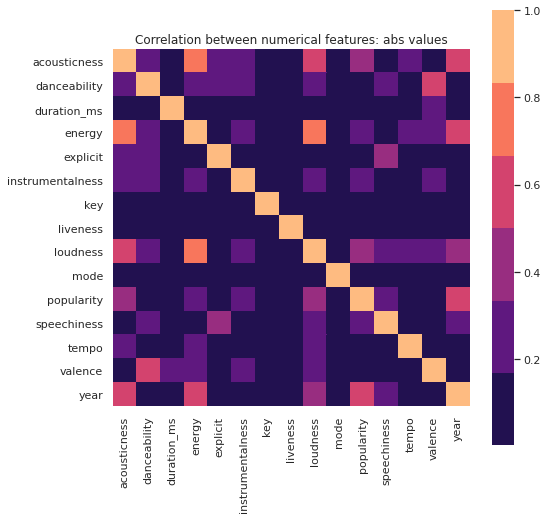

In [84]:
numeric_columns = df.columns[df.dtypes != 'object']
string_columns = df.columns[df.dtypes == 'object']
print(f'There are {len(numeric_columns)} numeric columns & {len(string_columns)} string columns')


numeric_df = pd.DataFrame(data=df, columns=numeric_columns, index=df.index)
corr = np.abs(numeric_df.corr())
fig, ax = plt.subplots(figsize=(8, 8))
cmap = sns.color_palette("magma")
sns.heatmap(corr, cmap=cmap, square=True)
plt.title('Correlation between numerical features: abs values')
plt.show()

In [85]:
series = np.abs(corr['popularity']).sort_values(ascending=False)
print('The most linear correlated features to POPULARITY are:')
for i, row in enumerate(series):
    if 0.2 <= row < 1:
      print(f'{series.index[i]:17} --> {row: .2f} (abs)')

The most linear correlated features to POPULARITY are:
year              -->  0.51 (abs)
acousticness      -->  0.40 (abs)
loudness          -->  0.34 (abs)
energy            -->  0.33 (abs)
instrumentalness  -->  0.30 (abs)


In [86]:
 sns_plot = sns.pairplot(df.sample(1000), height=10, vars=['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
        'instrumentalness', 'key', 'liveness', 'loudness', 
        'speechiness', 'tempo', 'valence', 'year'])
sns_plot.savefig('pairplot.png')
plt.title('Pairplot of Numerical Features exc. dummies')
plt.show()

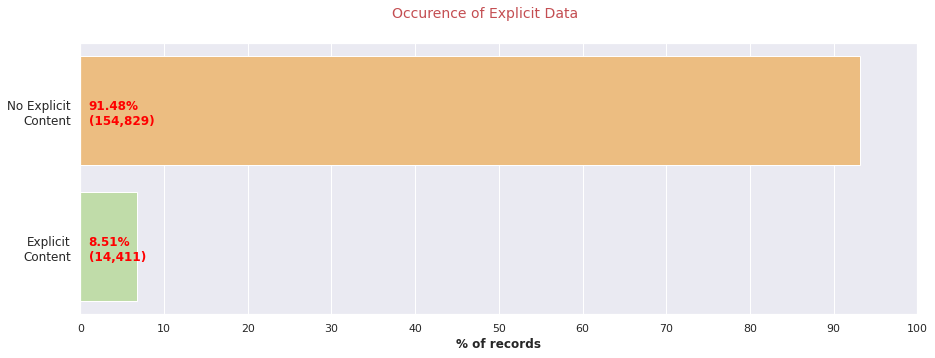

In [87]:
fig, ax = plt.subplots(figsize = (15, 5))
y_ticks = ['No Explicit\nContent', 'Explicit\nContent']
ax = sns.barplot(x = (df['explicit'].value_counts(normalize=True)*100),
                 y= y_ticks, 
                 data=df, palette='Spectral')
ax.set_xlabel('% of records', fontsize=12, weight='bold')
ax.set_xlim(0.0,100.0)
ax.set_xticks(ticks=range(0,101,10))
ax.set_yticklabels(labels=y_ticks, fontsize=12)
ax.text(s='91.48%\n(154,829)', x=1, y=0.1, fontdict={'weight': 'bold', 'c':'red'})
ax.text(s='8.51%\n(14,411)', x=1, y=1.1, fontdict={'weight': 'bold', 'c':'red'})

plt.suptitle('Occurence of Explicit Data', fontsize=14, c='r')
plt.show()

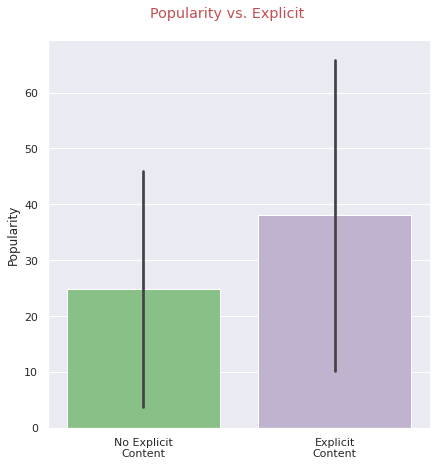

In [88]:
exp_data = sns.catplot(data=df, kind="bar",
                        x="explicit", y="popularity",
                        ci="sd", palette='Accent',
                        height=6)
exp_data.fig.suptitle('Popularity vs. Explicit', y=1.05, c='r')
exp_data.set_axis_labels("", "Popularity")
exp_data.set_xticklabels(['No Explicit\nContent', 'Explicit\nContent'])
plt.show()

Key
The 11-values of keys distribute between 4-13% each

Keys popularity' std is aprox. 20, makes it difficult to establish any correlation.

Key 3 has the lowest mean (of 24.67)

In [89]:
df['duration_ms'].corr(df['popularity'])

0.02471740774117412

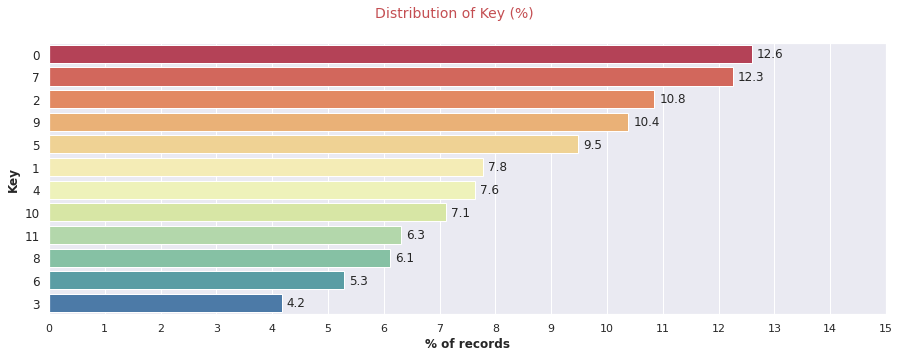

In [90]:
fig, ax = plt.subplots(figsize = (15, 5))
key_data = df['key'].value_counts(normalize=True, sort=True, ascending=True)*100
y_ticks = df['key'].value_counts().index
ax = sns.barplot(x = key_data.values, y= y_ticks, data = key_data, orient='h', palette='Spectral')
ax.set_xlabel('% of records', fontsize=12, weight='bold')
ax.set_ylabel('Key', fontsize=12, weight='bold')
ax.set_xlim(0.0,15.0, 0)
ax.set_xticks(ticks=range(0,16,1))
ax.set_yticklabels(labels=y_ticks, fontsize=12) #

rects = ax.patches

# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    x_value = rect.get_width() #f'{rect.get_width():.2f}'
    y_value = rect.get_y() + rect.get_height() / 2
    # Number of points between bar and label. Change to your liking.
    space = 5
    # Vertical alignment for positive values
    ha = 'left'

    # Use X value as label and format number with one decimal place
    label = f'{x_value:.1f}'

    # Create annotation
    plt.annotate(
        label,                      # Use `label` as label
        (x_value, y_value),         # Place label at end of the bar
        xytext=(space, 0),          # Horizontally shift label by `space`
        textcoords="offset points", # Interpret `xytext` as offset in points
        va='center',                # Vertically center label
        ha=ha)                      # Horizontally align label differently for
                                    # positive and negative values.

plt.suptitle('Distribution of Key (%)', fontsize=14, c='r')
plt.show()

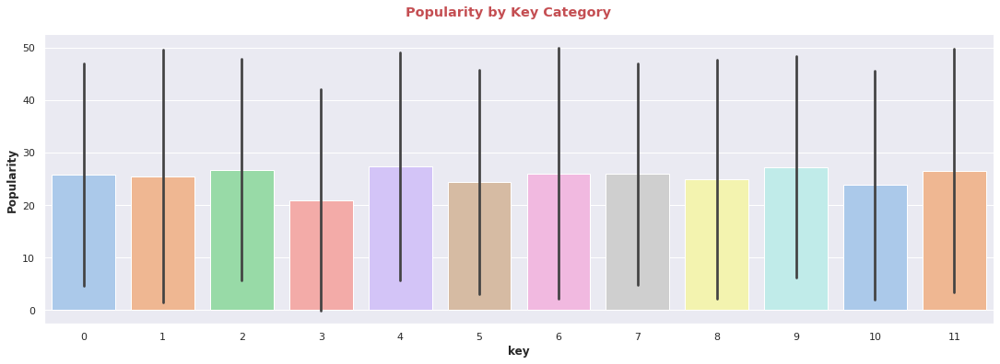

In [91]:
exp_data = sns.catplot(data=df, kind="bar",
                        x="key", y="popularity",
                        palette='pastel',
                        ci = 'sd',
                        height=5, aspect = 3)
exp_data.fig.suptitle('Popularity by Key Category', y=1.05, c='r', weight='bold')
exp_data.set_axis_labels("key", "Popularity", fontsize=12, weight='bold')
plt.show()

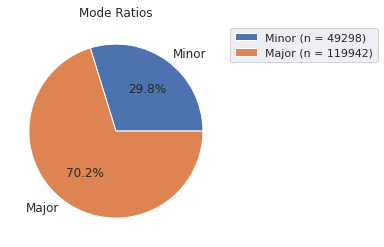

In [92]:
ax = df.groupby('mode')['popularity'].count().plot.pie(labels=['Minor', 'Major'],
                                 autopct='%1.1f%%', 
                                 fontsize=12)
ax.set_ylabel('')
ax.set_title('Mode Ratios')
ax.legend(labels=['Minor (n = 49298)', 'Major (n = 119942)'], bbox_to_anchor=(1, 1))
a = ax.get_anchor
plt.show()

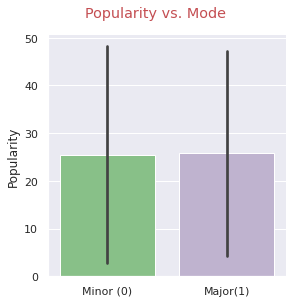

In [93]:
exp_data = sns.catplot(data=df, kind="bar",
                        x="mode", y="popularity",
                        ci="sd", palette='Accent',
                        height=4)
exp_data.fig.suptitle('Popularity vs. Mode', y=1.05, c='r')
exp_data.set_axis_labels("", "Popularity")
exp_data.set_xticklabels(['Minor (0)', 'Major(1)'])
plt.show()

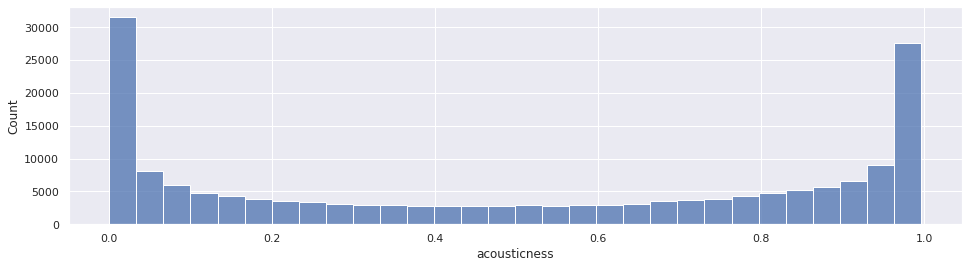

In [94]:
fig, ax = plt.subplots(figsize=(16, 4))
sns.histplot(x='acousticness', data=df, bins=30)
plt.show()

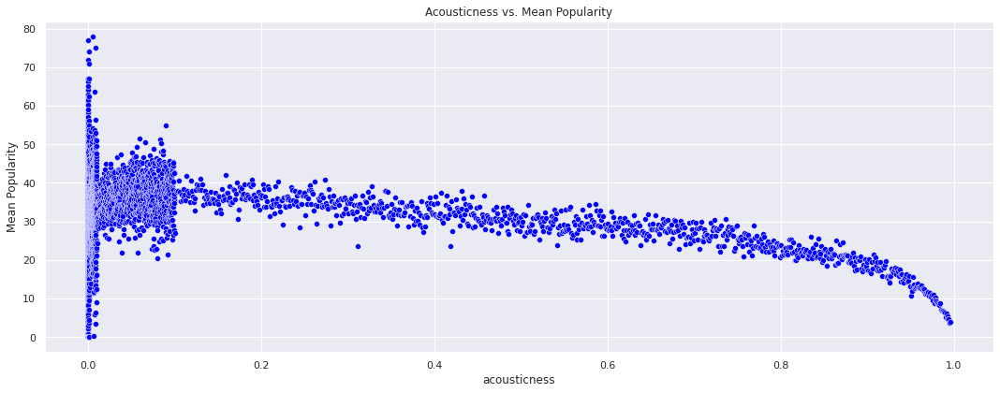

In [95]:
fig, ax = plt.subplots(figsize=(15, 6))
ax1_data =  df.groupby('acousticness')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='acousticness', y='popularity', data=ax1_data, color='blue', ax=ax)
ax.set_title('Acousticness vs. Mean Popularity')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

In [96]:
a= df['danceability'].corr(df['popularity']).round(2)
print(f'The pearson corr -->{a:^10}')

The pearson corr -->   0.12   


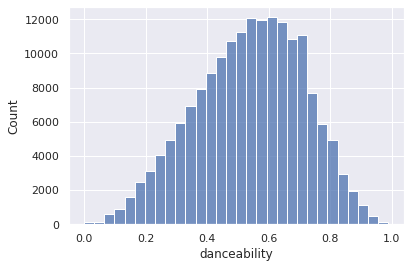

In [97]:
sns.histplot(x='danceability', data=df, bins=30)
plt.show()

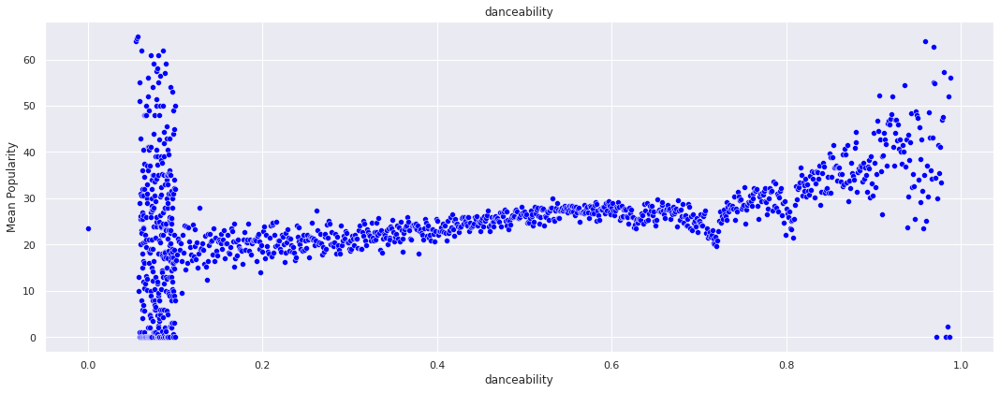

In [98]:
fig, ax = plt.subplots(1, figsize=(15, 6), sharey=True, sharex = True)
ax_data =  df.groupby('danceability')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='danceability', y='popularity', data=ax_data, color='blue', ax=ax)
ax.set_title('danceability')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

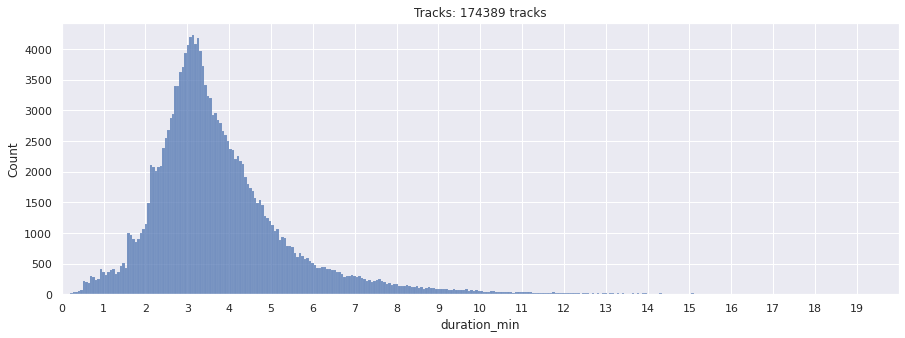

In [99]:
df['duration_min'] = df['duration_ms']/60000
tracks=df.loc[df['duration_min']!=0]
fig, ax = plt.subplots(figsize = (15, 5))
ax = sns.histplot(data=tracks, x='duration_min')
ax.set_title(f'Tracks: {tracks.shape[0]} tracks')
ax.set_xticks(range(0,20,1))
ax.set_xlim(0,20)
plt.show()

In [100]:
a= df['energy'].corr(df['popularity']).round(3)
print(f'The pearson corr is -->{a:^10}')

The pearson corr is -->  0.329   


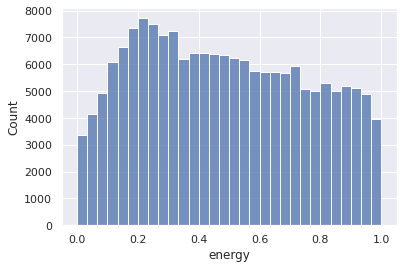

In [101]:
sns.histplot(x='energy', data=df, bins=30)
plt.show()

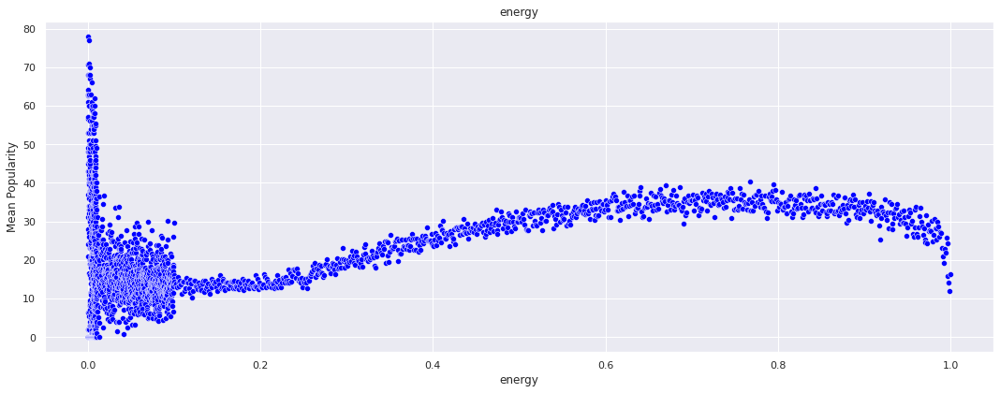

In [102]:
fig, ax = plt.subplots(1, figsize=(15, 6), sharey=True, sharex = True)
ax_data =  df.groupby('energy')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='energy', y='popularity', data=ax_data, color='blue', ax=ax)
ax.set_title('energy')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

In [103]:
a= df['instrumentalness'].corr(df['popularity']).round(3)
print(f'The pearson corr is -->{a:^10}')

The pearson corr is -->  -0.301  


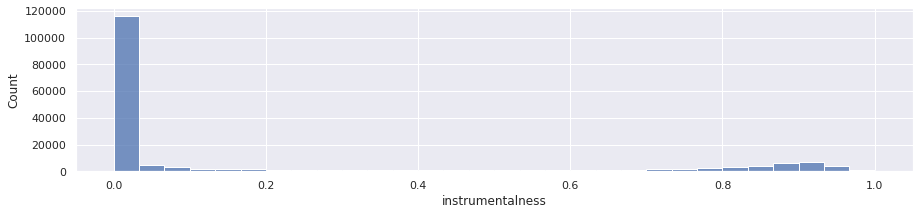

In [104]:
fig, ax = plt.subplots(figsize = (15,3))
ax = sns.histplot(x='instrumentalness', data=df, bins=30)
plt.show()

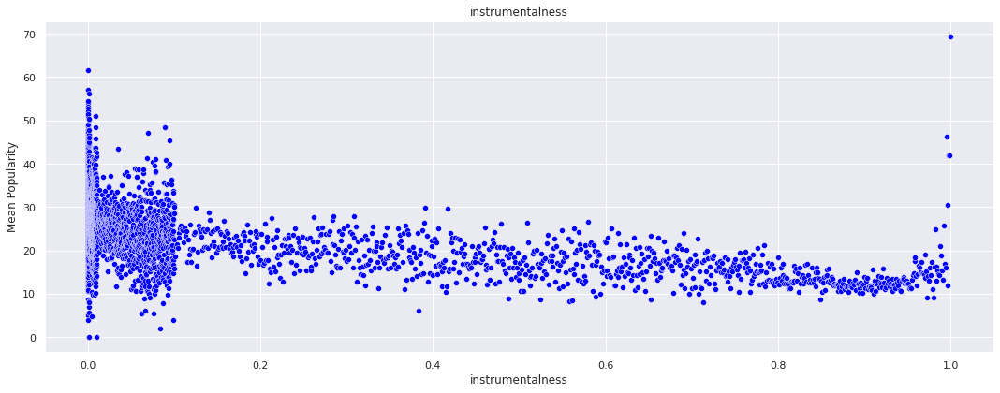

In [105]:
fig, ax = plt.subplots(1, figsize=(15, 6), sharey=True, sharex = True)
ax_data =  df.groupby('instrumentalness')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='instrumentalness', y='popularity', data=ax_data, color='blue', ax=ax)
ax.set_title('instrumentalness')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

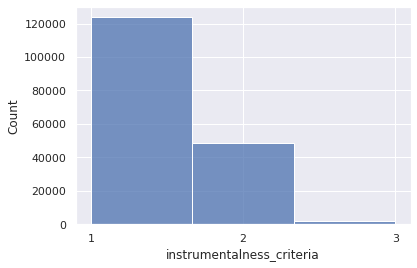

In [106]:
criteria= [df['instrumentalness'].between(0, 0.1),
           df['instrumentalness'].between(0.1000001, 0.95),
           df['instrumentalness'].between(0.950001, 1)]
values = [1, 2, 3]
df['instrumentalness_criteria'] = np.select(criteria, values, 0)
fig, ax = plt.subplots()
sns.histplot(x='instrumentalness_criteria',ax=ax, data=df, bins=3 )
ax.set_xticks(range(1,4))
plt.show()

In [107]:
a= df['liveness'].corr(df['popularity']).round(3)
print(f'The pearson corr is -->{a:^10}')

The pearson corr is -->  -0.079  


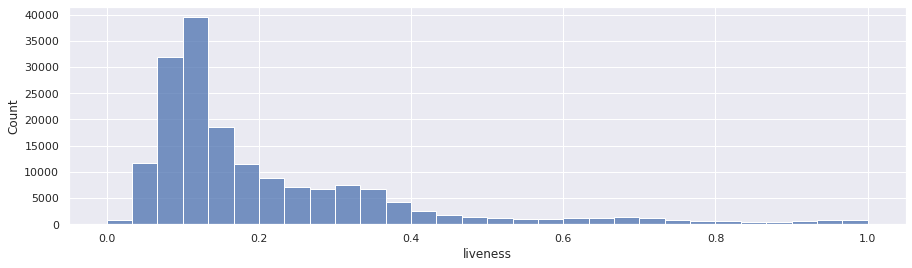

In [108]:
fig, ax = plt.subplots(figsize=(15, 4))
sns.histplot(x='liveness', data=df, bins=30)
plt.show()

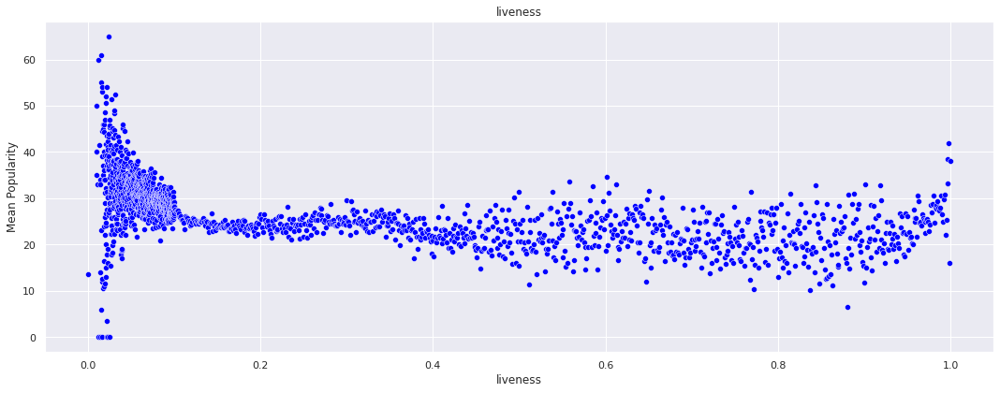

In [109]:
fig, ax = plt.subplots(1, figsize=(15, 6), sharey=True, sharex = True)
ax_data =  df.groupby('liveness')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='liveness', y='popularity', data=ax_data, color='blue', ax=ax)
ax.set_title('liveness')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

In [110]:
a= df['loudness'].corr(df['popularity']).round(3)
print(f'The pearson corr is -->{a:^10}')

The pearson corr is -->  0.337   


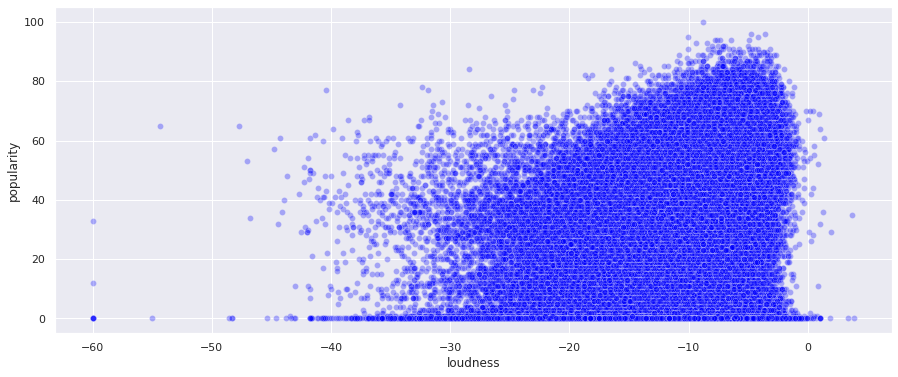

In [111]:
fig, ax = plt.subplots(figsize = (15, 6))
sns.scatterplot(x='loudness', y='popularity', data=df, color='blue', alpha=0.3)
plt.show()

In [112]:
a= df['speechiness'].corr(df['popularity']).round(2)
print(f'The pearson corr is -->{a:^10}')

The pearson corr is -->   -0.2   


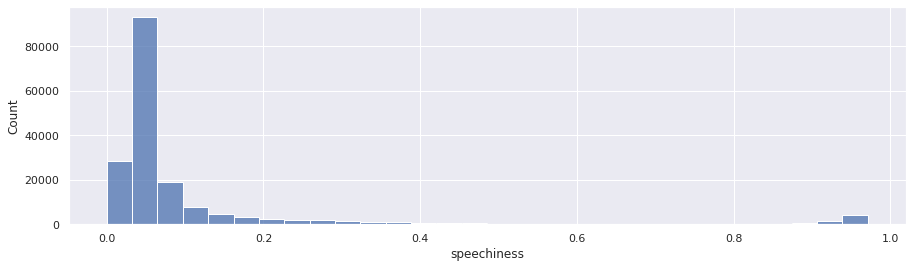

In [113]:
fig, ax = plt.subplots(figsize=(15, 4))
sns.histplot(x='speechiness', data=df, bins=30)
plt.show()

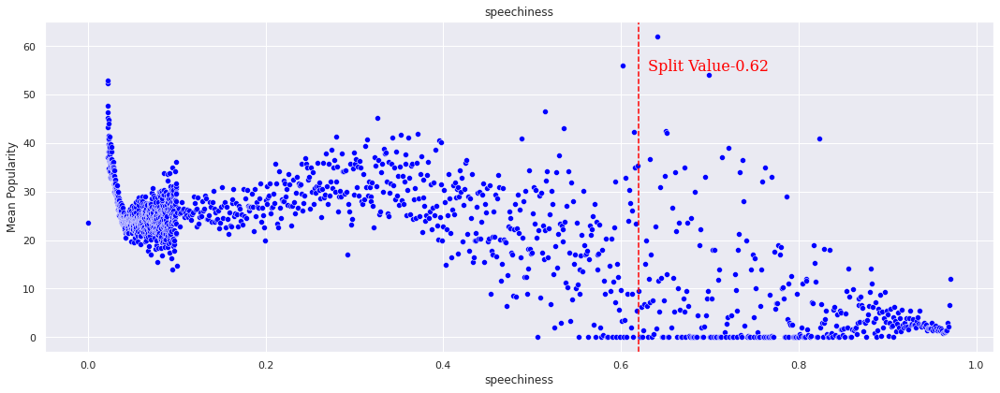

In [114]:
fig, ax = plt.subplots(1, figsize=(15, 6), sharey=True, sharex = True)
ax_data =  df.groupby('speechiness')['popularity'].mean().to_frame()
ax = sns.scatterplot(x='speechiness', y='popularity', data=ax_data, color='blue', ax=ax)

ax.set_title('speechiness')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

In [115]:
a = df['tempo'].corr(df['popularity']).round(2)
print(f"Linear correlation is {a}")

Linear correlation is 0.09


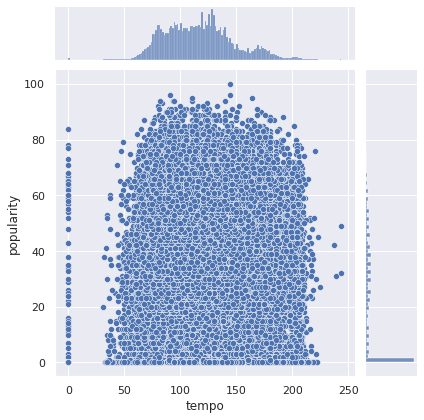

In [116]:
sns.jointplot(x='tempo', y='popularity', data=df)
plt.show()

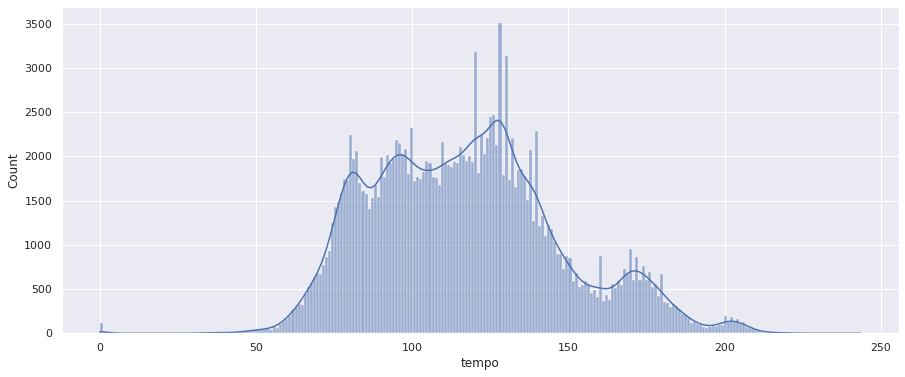

In [117]:
fig, ax = plt.subplots(figsize = (15, 6))
ax = sns.histplot(x='tempo', data=df, bins=250, kde=True)
plt.show()

In [118]:
a = df['valence'].corr(df['popularity']).round(2)
print(f"Linear correlation is {a}")

Linear correlation is 0.06


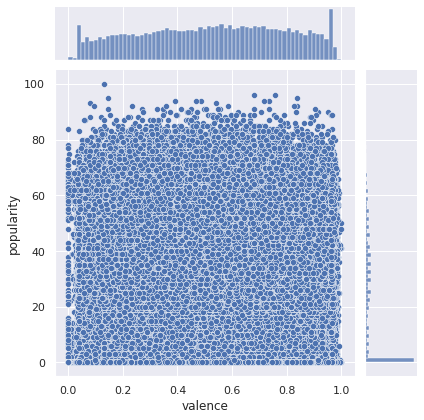

In [119]:
sns.jointplot(x='valence', y='popularity', data=df)
plt.show()

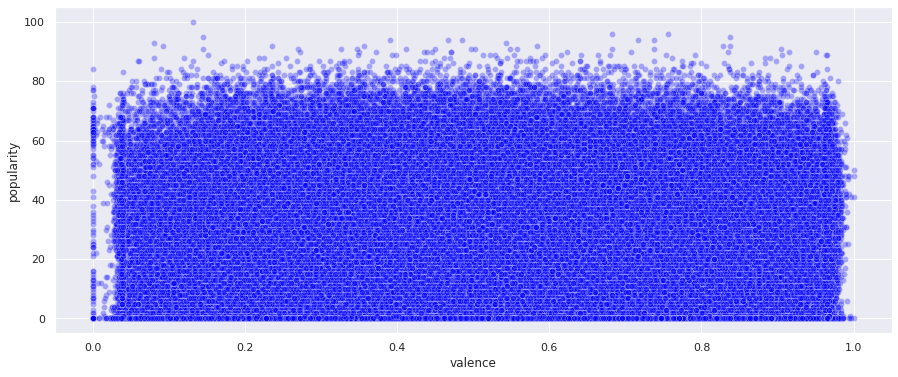

In [120]:
fig, ax = plt.subplots(figsize = (15, 6))
sns.scatterplot(x='valence', y='popularity', data=df, color='blue', alpha=0.3)
plt.show()

In [121]:
a = df['year'].corr(df['popularity']).round(2)
print(f"Linear correlation is {a}")

Linear correlation is 0.51


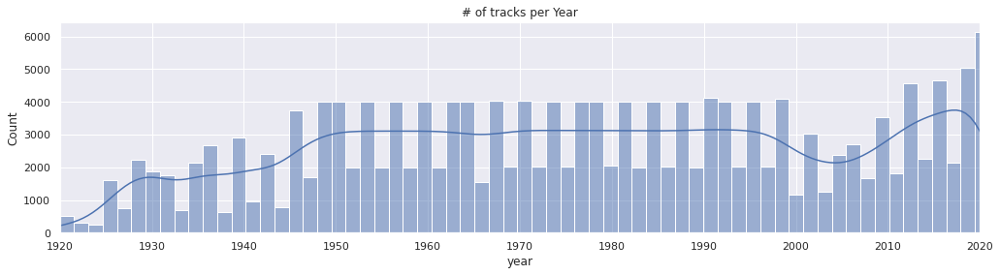

In [122]:
fig, ax = plt.subplots(figsize=(17, 4))
ax = sns.histplot(data=df, x='year', kde=True)
ax.set_xlim(1920,2020)
ax.set_xticks(range(1920, 2021, 10))
ax.set_title('# of tracks per Year')
plt.show()

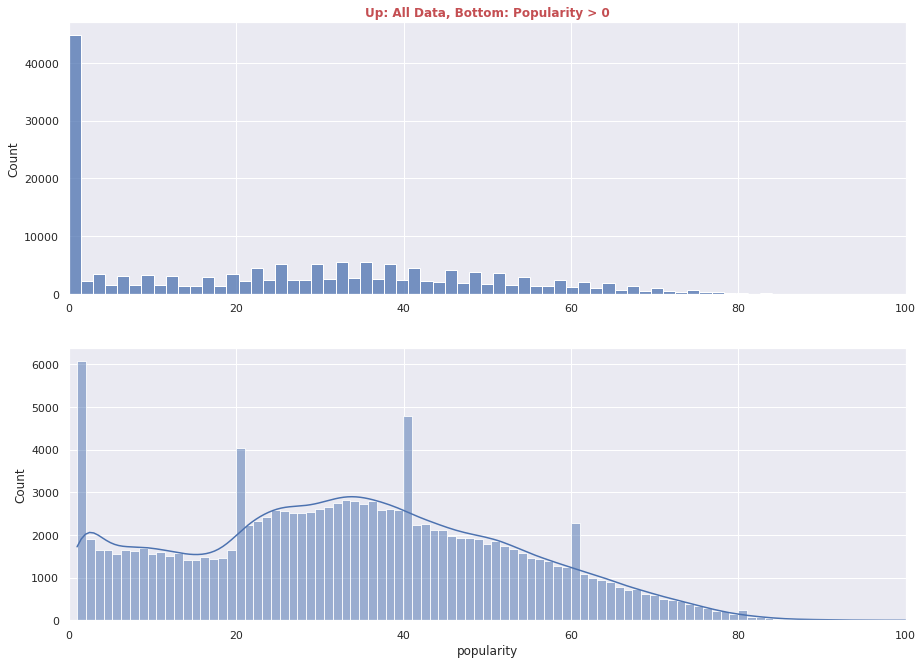

In [123]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 11))
ax1 = sns.histplot(data=df, x=df['popularity'], ax=ax1)
ax2 = sns.histplot(data=df, x=df.loc[df['popularity']>0,'popularity'], ax=ax2, kde=True)
ax1.set_xlim(0,100)
ax2.set_xlim(0,100)
ax1.set_xlabel('')
ax1.set_title('Up: All Data, Bottom: Popularity > 0', c='r', weight='bold')
plt.show()

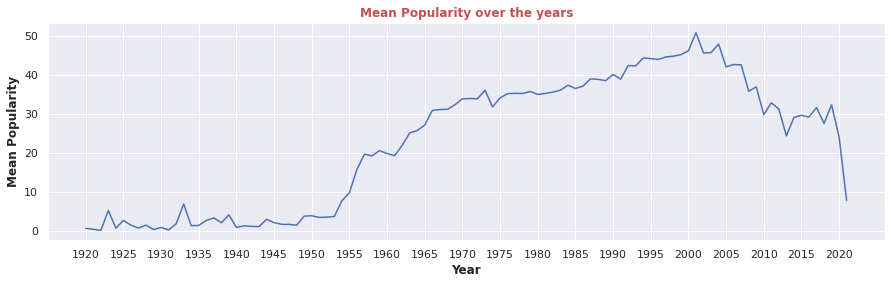

In [124]:
fig, ax = plt.subplots(figsize=(15, 4))
ax = df.groupby('year')['popularity'].mean().plot()
ax.set_title('Mean Popularity over the years', c='r', weight='bold')
ax.set_ylabel('Mean Popularity', weight='bold')
ax.set_xlabel('Year', weight='bold')
ax.set_xticks(range(1920, 2021, 5))
plt.show()

In [125]:
df=pd.read_csv('data.csv')
cols = list(pd.read_csv('data.csv', nrows =1))
df = pd.read_csv('data.csv', usecols=[i for i in cols if i not in ['id','name','release_date']])

# Remove duplicated
df = df[~df.duplicated()==1]
# df = df.sample(frac=0.3)
#Split the data to train and test
X_train, X_test, y_train, y_test = split(df.drop('popularity', axis=1), df['popularity'], test_size = 0.2, random_state = 12345)

In [126]:
class ArtistsTransformer():
  """ This transformer recives a DF with a feature 'artists' of dtype object
      and convert the feature to a float value as follows:
      1. Replace the data with the artists mean popularity
      2. Replace values where artists appear less than MinCnt with y.mean()
      3. Replace values where artists appear more than MaxCnt with 0
      
      PARAMETERS:
      ----------
      MinCnt (int): Minimal treshold of artisits apear in dataset, default = 3
      MaxCnt (int): Maximal treshold of artisits apear in dataset, default = 600

      RERTURN:
      ----------
      A DataFrame with converted artists str feature to ordinal floats
  """

  def __init__(self, MinCnt = 3.0, MaxCnt = 600.0):
      self.MinCnt = MinCnt
      self.MaxCnt = MaxCnt
      self.artists_df = None
  
  def fit (self, X, y):
      self.artists_df =  y.groupby(X.artists).agg(['mean', 'count'])
      self.artists_df.loc['unknown'] = [y.mean(), 1]
      self.artists_df.loc[self.artists_df['count'] <= self.MinCnt, 'mean'] = y.mean()
      self.artists_df.loc[self.artists_df['count'] >= self.MaxCnt, 'mean'] = 0
      return self

  def transform(self, X, y=None):
      X['artists'] = np.where(X['artists'].isin(self.artists_df.index), X['artists'], 'unknown')
      X['artists'] = X['artists'].map(self.artists_df['mean'])
      return X

In [127]:
artists_transformer = ArtistsTransformer(MinCnt=2)
X_train = artists_transformer.fit(X_train, y_train).transform(X_train, y_train)
X_test = artists_transformer.transform(X_test, y_test)

In [128]:
def instrumentalness_criteria(X):
    X['instrumentalness'] = list(map((lambda x: 1 if x < 0.1 else (3 if x > 0.95 else 2)), X.instrumentalness))

instrumentalness_tranformer = FunctionTransformer(instrumentalness_criteria)
instrumentalness_tranformer.transform(X_train)
instrumentalness_tranformer.transform(X_test)

In [129]:
def speech_criteria(X):
    X['speechiness'] = list(map((lambda x: 1 if x > 0.62 else 0), X.speechiness))

speech_tranformer = FunctionTransformer(speech_criteria)
speech_tranformer.transform(X_train)
speech_tranformer.transform(X_test)

In [130]:
class ReplaceZeroTransformer():
    """Eliminates Zero values from tempo columns and replace it 
       with the median or mean of non-zero values as specified.
       defaut is set to 'median'.
    """

    def __init__(self, method='median'):
        self.method = method

    def transform(self, X):
        if self.method == 'median':
            X.loc[X['tempo']==0, 'tempo'] = X.loc[X['tempo']>0, 'tempo'].median()
        elif self.method == 'mean':
            X.loc[X['tempo']==0, 'tempo'] = X.loc[X['tempo']>0, 'tempo'].mean()
        else:
            raise Exception("Method can be 'median' or 'mean' only!")
        return X

In [131]:
tempo_transformer = ReplaceZeroTransformer()
X_train = tempo_transformer.transform(X_train)
X_test = tempo_transformer.transform(X_test)

In [132]:
ohe = OneHotEncoder(categories='auto', drop='first')

# Train
feature_arr = ohe.fit_transform(X_train[['key']]).toarray()
columns_key = ['key_'+str(i) for i in list(set(X_train['key'].values))[1:]]
feature_labels = columns_key
feature_labels = np.concatenate((feature_labels), axis=None)
features = pd.DataFrame(feature_arr, columns = feature_labels, index = X_train.index)
X_train = pd.concat([X_train, features], axis=1).drop(['key'], axis=1)

# Test
feature_arr = ohe.fit_transform(X_test[['key']]).toarray()
columns_key = ['key_'+str(i) for i in list(set(X_test['key'].values))[1:]]
feature_labels = columns_key
feature_labels = np.concatenate((feature_labels), axis=None)
features = pd.DataFrame(feature_arr, columns = feature_labels, index = X_test.index)
X_test = pd.concat([X_test, features], axis=1).drop(['key'], axis=1)

In [133]:
scaler = MinMaxScaler()
cols = ['duration_ms','loudness','tempo']
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.fit_transform(X_test[cols])

In [134]:
y_train = y_train / 100
y_test = y_test / 100

In [135]:
nl = '\n'
print(f'X_train shape is: {X_train.shape} {nl}y_train shape is: {y_train.shape} {nl}X_test shape is: {X_test.shape} {nl}y_test shape is: {y_test.shape}')

X_train shape is: (136749, 25) 
y_train shape is: (136749,) 
X_test shape is: (34188, 25) 
y_test shape is: (34188,)


In [136]:
'''
year              -->  0.51 (abs)
acousticness      -->  0.40 (abs)
loudness          -->  0.34 (abs)
energy            -->  0.33 (abs)
instrumentalness  -->  0.30 (abs)

'''
print(X_train.columns)
LR = LinearRegression()
cols = [col for col in X_train.columns if abs(X_train[col].corr(y_train))<0.25]
cols=cols+['artists']
X_dropped=X_train.drop(columns=cols)
# Fit the model and
LR.fit(X_train.drop(columns=cols), y_train)

# Train Predicting with the model
y_train_pred = LR.predict(X_train.drop(columns=cols)).clip(0, 1)

# RMSE Train
LR_rmse = np.sqrt(mse(y_train, y_train_pred))
print(f"RMSE Train = {LR_rmse:.5f}")

#Predicting with the model
y_test_pred = LR.predict(X_test.drop(columns=cols)).clip(0, 1)

# RMSE Test
LR_rmse = np.sqrt(mse(y_test, y_test_pred))
print(f"RMSE Test = {LR_rmse:.5f}")

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'instrumentalness', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'valence', 'year', 'key_1', 'key_2', 'key_3',
       'key_4', 'key_5', 'key_6', 'key_7', 'key_8', 'key_9', 'key_10',
       'key_11'],
      dtype='object')
Index(['acousticness', 'energy', 'instrumentalness', 'loudness', 'year'], dtype='object')
RMSE Train = 0.17532
RMSE Test = 0.17412


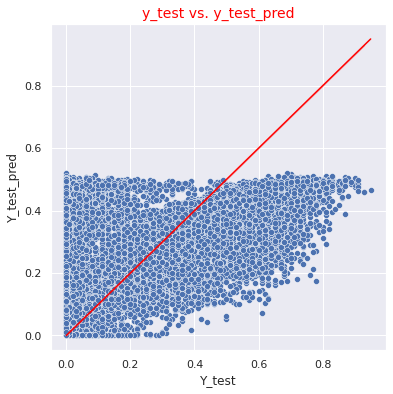

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             popularity   R-squared (uncentered):                   0.843
Model:                            OLS   Adj. R-squared (uncentered):              0.843
Method:                 Least Squares   F-statistic:                          2.938e+04
Date:                Sun, 11 Apr 2021   Prob (F-statistic):                        0.00
Time:                        08:15:10   Log-Likelihood:                          79891.
No. Observations:              136749   AIC:                                 -1.597e+05
Df Residuals:                  136724   BIC:                                 -1.595e+05
Df Model:                          25                                                  
Covariance Type:            nonrobust                                                  
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
acousticness        -0.0555      0.002    -34.203      0.000      -0.059      -0.052
artists              0.0089   2.64e-05    335.175      0.000       0.009       0.009
danceability         0.0220      0.003      7.997      0.000       0.017       0.027
duration_ms         -0.0637      0.014     -4.718      0.000      -0.090      -0.037
energy              -0.0180      0.003     -6.122      0.000      -0.024      -0.012
explicit             0.0789      0.002     50.218      0.000       0.076       0.082
instrumentalness    -0.0419      0.001    -48.973      0.000      -0.044      -0.040
liveness            -0.0572      0.002    -27.171      0.000      -0.061      -0.053
loudness            -0.0174      0.007     -2.415      0.016      -0.032      -0.003
mode                -0.0014      0.001     -1.633      0.102      -0.003       0.000
speechiness         -0.0777      0.002    -35.407      0.000      -0.082      -0.073
tempo               -0.0122      0.003     -4.507      0.000      -0.018      -0.007
valence             -0.0030      0.002     -1.622      0.105      -0.007       0.001
year              7.288e-05   2.83e-06     25.766      0.000    6.73e-05    7.84e-05
key_1                0.0006      0.002      0.353      0.724      -0.003       0.004
key_2               -0.0021      0.002     -1.403      0.160      -0.005       0.001
key_3               -0.0076      0.002     -3.688      0.000      -0.012      -0.004
key_4                0.0004      0.002      0.239      0.811      -0.003       0.004
key_5               -0.0014      0.002     -0.889      0.374      -0.004       0.002
key_6               -0.0004      0.002     -0.229      0.819      -0.004       0.003
key_7               -0.0053      0.001     -3.633      0.000      -0.008      -0.002
key_8                0.0009      0.002      0.525      0.600      -0.003       0.004
key_9               -0.0039      0.002     -2.555      0.011      -0.007      -0.001
key_10              -0.0055      0.002     -3.232      0.001      -0.009      -0.002
key_11              -0.0054      0.002     -3.002      0.003      -0.009      -0.002
==============================================================================
Omnibus:                     8667.135   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14227.822
Skew:                           0.508   Prob(JB):                         0.00
Kurtosis:                       4.211   Cond. No.                     7.32e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is

In [137]:
fig, ax = plt.subplots(figsize=(6, 6))
ax = sns.scatterplot(x=y_test, y=y_test_pred)
sns.lineplot(x=y_test, y=y_test, color='red', ax=ax)
ax.set_xlabel('Y_test')
ax.set_ylabel('Y_test_pred')
ax.set_title('y_test vs. y_test_pred', fontsize=14, color='red')
plt.show()
import statsmodels.api as sm
model = sm.OLS(y_train, X_train).fit()
model.summary()

In [138]:
'''
year              -->  0.51 (abs)
acousticness      -->  0.40 (abs)
loudness          -->  0.34 (abs)
energy            -->  0.33 (abs)
instrumentalness  -->  0.30 (abs)
artist data
'''
LR = LinearRegression()
cols = [col for col in X_train.columns if abs(X_train[col].corr(y_train))<0.25]
X_dropped=X_train.drop(columns=cols)
print(X_dropped.columns)
# Fit the model and
LR.fit(X_train.drop(columns=cols), y_train)

# Train Predicting with the model
y_train_pred = LR.predict(X_train.drop(columns=cols)).clip(0, 1)

# RMSE Train
LR_rmse = np.sqrt(mse(y_train, y_train_pred))
print(f"RMSE Train = {LR_rmse:.5f}")

#Predicting with the model
y_test_pred = LR.predict(X_test.drop(columns=cols)).clip(0, 1)

# RMSE Test
LR_rmse = np.sqrt(mse(y_test, y_test_pred))
print(f"RMSE Test = {LR_rmse:.5f}")

Index(['acousticness', 'artists', 'energy', 'instrumentalness', 'loudness',
       'year'],
      dtype='object')
RMSE Train = 0.13327
RMSE Test = 0.13902


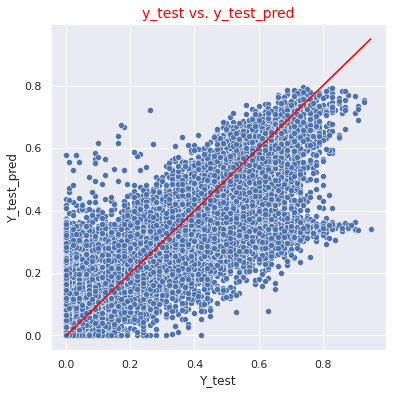

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             popularity   R-squared (uncentered):                   0.843
Model:                            OLS   Adj. R-squared (uncentered):              0.843
Method:                 Least Squares   F-statistic:                          2.938e+04
Date:                Sun, 11 Apr 2021   Prob (F-statistic):                        0.00
Time:                        08:15:14   Log-Likelihood:                          79891.
No. Observations:              136749   AIC:                                 -1.597e+05
Df Residuals:                  136724   BIC:                                 -1.595e+05
Df Model:                          25                                                  
Covariance Type:            nonrobust                                                  
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
acousticness        -0.0555      0.002    -34.203      0.000      -0.059      -0.052
artists              0.0089   2.64e-05    335.175      0.000       0.009       0.009
danceability         0.0220      0.003      7.997      0.000       0.017       0.027
duration_ms         -0.0637      0.014     -4.718      0.000      -0.090      -0.037
energy              -0.0180      0.003     -6.122      0.000      -0.024      -0.012
explicit             0.0789      0.002     50.218      0.000       0.076       0.082
instrumentalness    -0.0419      0.001    -48.973      0.000      -0.044      -0.040
liveness            -0.0572      0.002    -27.171      0.000      -0.061      -0.053
loudness            -0.0174      0.007     -2.415      0.016      -0.032      -0.003
mode                -0.0014      0.001     -1.633      0.102      -0.003       0.000
speechiness         -0.0777      0.002    -35.407      0.000      -0.082      -0.073
tempo               -0.0122      0.003     -4.507      0.000      -0.018      -0.007
valence             -0.0030      0.002     -1.622      0.105      -0.007       0.001
year              7.288e-05   2.83e-06     25.766      0.000    6.73e-05    7.84e-05
key_1                0.0006      0.002      0.353      0.724      -0.003       0.004
key_2               -0.0021      0.002     -1.403      0.160      -0.005       0.001
key_3               -0.0076      0.002     -3.688      0.000      -0.012      -0.004
key_4                0.0004      0.002      0.239      0.811      -0.003       0.004
key_5               -0.0014      0.002     -0.889      0.374      -0.004       0.002
key_6               -0.0004      0.002     -0.229      0.819      -0.004       0.003
key_7               -0.0053      0.001     -3.633      0.000      -0.008      -0.002
key_8                0.0009      0.002      0.525      0.600      -0.003       0.004
key_9               -0.0039      0.002     -2.555      0.011      -0.007      -0.001
key_10              -0.0055      0.002     -3.232      0.001      -0.009      -0.002
key_11              -0.0054      0.002     -3.002      0.003      -0.009      -0.002
==============================================================================
Omnibus:                     8667.135   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14227.822
Skew:                           0.508   Prob(JB):                         0.00
Kurtosis:                       4.211   Cond. No.                     7.32e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is

In [139]:
fig, ax = plt.subplots(figsize=(6, 6))
ax = sns.scatterplot(x=y_test, y=y_test_pred)
sns.lineplot(x=y_test, y=y_test, color='red', ax=ax)
ax.set_xlabel('Y_test')
ax.set_ylabel('Y_test_pred')
ax.set_title('y_test vs. y_test_pred', fontsize=14, color='red')
plt.show()
import statsmodels.api as sm
model = sm.OLS(y_train, X_train).fit()
model.summary()

In [140]:
'''
All Available Features
'''
LR = LinearRegression()

# Fit the model and
LR.fit(X_train, y_train)

# Train Predicting with the model
y_train_pred = LR.predict(X_train).clip(0, 1)

# RMSE Train
LR_rmse = np.sqrt(mse(y_train, y_train_pred))
print(f"RMSE Train = {LR_rmse:.6f}")

#Predicting with the model
y_test_pred = LR.predict(X_test).clip(0, 1)

# RMSE Test
LR_rmse = np.sqrt(mse(y_test, y_test_pred))
print(f"RMSE Test = {LR_rmse:.6f}")

RMSE Train = 0.131639
RMSE Test = 0.137098


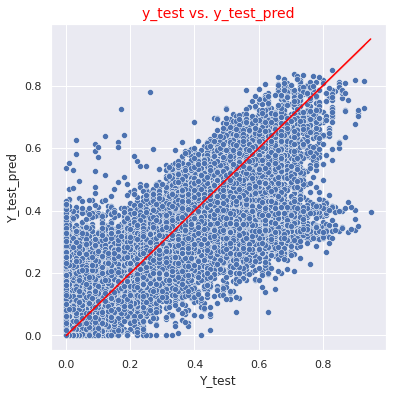

In [141]:
fig, ax = plt.subplots(figsize=(6, 6))
ax = sns.scatterplot(x=y_test, y=y_test_pred)
sns.lineplot(x=y_test, y=y_test, color='red', ax=ax)
ax.set_xlabel('Y_test')
ax.set_ylabel('Y_test_pred')
ax.set_title('y_test vs. y_test_pred', fontsize=14, color='red')
plt.show()

In [142]:
import statsmodels.api as sm
model = sm.OLS(y_train, X_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             popularity   R-squared (uncentered):                   0.843
Model:                            OLS   Adj. R-squared (uncentered):              0.843
Method:                 Least Squares   F-statistic:                          2.938e+04
Date:                Sun, 11 Apr 2021   Prob (F-statistic):                        0.00
Time:                        08:15:17   Log-Likelihood:                          79891.
No. Observations:              136749   AIC:                                 -1.597e+05
Df Residuals:                  136724   BIC:                                 -1.595e+05
Df Model:                          25                                                  
Covariance Type:            nonrobust                                                  
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
acousticness        -0.0555      0.002    -34.203      0.000      -0.059      -0.052
artists              0.0089   2.64e-05    335.175      0.000       0.009       0.009
danceability         0.0220      0.003      7.997      0.000       0.017       0.027
duration_ms         -0.0637      0.014     -4.718      0.000      -0.090      -0.037
energy              -0.0180      0.003     -6.122      0.000      -0.024      -0.012
explicit             0.0789      0.002     50.218      0.000       0.076       0.082
instrumentalness    -0.0419      0.001    -48.973      0.000      -0.044      -0.040
liveness            -0.0572      0.002    -27.171      0.000      -0.061      -0.053
loudness            -0.0174      0.007     -2.415      0.016      -0.032      -0.003
mode                -0.0014      0.001     -1.633      0.102      -0.003       0.000
speechiness         -0.0777      0.002    -35.407      0.000      -0.082      -0.073
tempo               -0.0122      0.003     -4.507      0.000      -0.018      -0.007
valence             -0.0030      0.002     -1.622      0.105      -0.007       0.001
year              7.288e-05   2.83e-06     25.766      0.000    6.73e-05    7.84e-05
key_1                0.0006      0.002      0.353      0.724      -0.003       0.004
key_2               -0.0021      0.002     -1.403      0.160      -0.005       0.001
key_3               -0.0076      0.002     -3.688      0.000      -0.012      -0.004
key_4                0.0004      0.002      0.239      0.811      -0.003       0.004
key_5               -0.0014      0.002     -0.889      0.374      -0.004       0.002
key_6               -0.0004      0.002     -0.229      0.819      -0.004       0.003
key_7               -0.0053      0.001     -3.633      0.000      -0.008      -0.002
key_8                0.0009      0.002      0.525      0.600      -0.003       0.004
key_9               -0.0039      0.002     -2.555      0.011      -0.007      -0.001
key_10              -0.0055      0.002     -3.232      0.001      -0.009      -0.002
key_11              -0.0054      0.002     -3.002      0.003      -0.009      -0.002
==============================================================================
Omnibus:                     8667.135   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14227.822
Skew:                           0.508   Prob(JB):                         0.00
Kurtosis:                       4.211   Cond. No.                     7.32e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is

In [143]:
'''
Decision Tree

year              -->  0.51 (abs)
acousticness      -->  0.40 (abs)
loudness          -->  0.34 (abs)
energy            -->  0.33 (abs)
instrumentalness  -->  0.30 (abs)
artists
'''
cols = [col for col in X_train.columns if abs(X_train[col].corr(y_train))<0.25]
RMSE3_train, RMSE3_test = [], []

for i in range(2,200):
  tree = DecisionTreeRegressor(random_state = 15, max_leaf_nodes=i)
  tree.fit(X_train.drop(columns=cols), y_train)
  y_train_pred = tree.predict(X_train.drop(columns=cols)).clip(0, 1)
  train_rmse = np.sqrt(mse(y_train, y_train_pred))
  RMSE3_train.append(train_rmse.round(3))
  y_test_pred = tree.predict(X_test.drop(columns=cols)).clip(0, 1)
  test_rmse = np.sqrt(mse(y_test, y_test_pred))
  RMSE3_test.append(test_rmse.round(3))

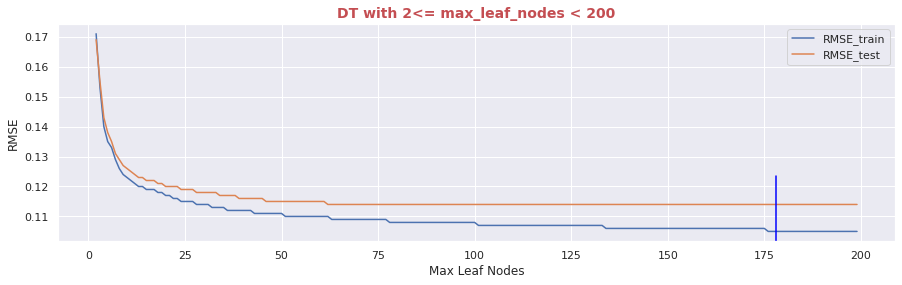

In [144]:
fig, ax = plt.subplots(figsize=(15,4))
x = np.arange(2, 200)
ax = sns.lineplot(x=x, y=RMSE3_train)
sns.lineplot(x=x, y=RMSE3_test, ax=ax)
ax.axvline(x=178, ymin=0, ymax=0.3, color='blue')
# ax.axvline(x=139, ymin=0.5, ymax=0.8, color='orange')
ax.legend(labels=['RMSE_train', 'RMSE_test'], bbox_to_anchor=(1, 1))
ax.set_xlabel('Max Leaf Nodes')
ax.set_ylabel('RMSE')
ax.set_title('DT with 2<= max_leaf_nodes < 200', c='r', fontdict={'c':'r', 'fontsize':14, 'weight':'bold'})
plt.show()

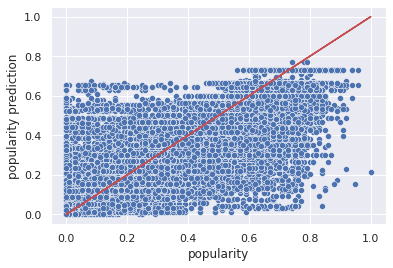

In [145]:
ax = sns.scatterplot(x=y_train, y=y_train_pred)
ax.plot(y_train, y_train, 'r')
ax.set_ylabel('popularity prediction')
plt.show()

In [146]:
gap3 = [(RMSE3_train[i]/RMSE3_test[i]) for i, num in enumerate(RMSE3_train)]

print(f'Minimum validiation is: {min(gap3):.3%} in index number {gap3.index(min(gap3))}')
print(f'Maximum validiation is: {max(gap3):.3%} in index number {gap3.index(max(gap3))}')

Minimum validiation is: 92.105% in index number 174
Maximum validiation is: 101.183% in index number 0


In [147]:
print(RMSE3_train[174])
print(RMSE3_test[174])

0.105
0.114


In [148]:
cols = [col for col in X_train.columns if abs(X_train[col].corr(y_train))<0.25]
tree = DecisionTreeRegressor(max_leaf_nodes=176)
tree.fit(X_train.drop(columns=cols), y_train)
y_train_pred = tree.predict(X_train.drop(columns=cols)).clip(0, 1)
train_rmse = np.sqrt(mse(y_train, y_train_pred))
y_test_pred = tree.predict(X_test.drop(columns=cols)).clip(0, 1)
test_rmse = np.sqrt(mse(y_test, y_test_pred))
print(f'train: {train_rmse}')
print(f'test: {test_rmse}')

train: 0.10547000217865458
test: 0.11396974776046945


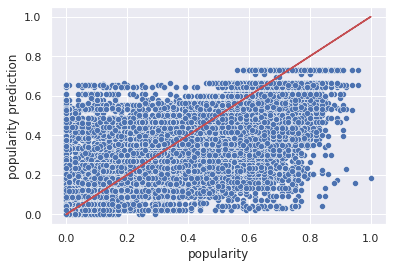

In [149]:
ax = sns.scatterplot(x=y_train, y=y_train_pred)
ax.plot(y_train, y_train, 'r')
ax.set_ylabel('popularity prediction')
plt.show()

In [150]:
print('Feature importances:')
for i, col in enumerate(X_train.drop(columns=cols).columns):
  print(f'{col:12}: {tree.feature_importances_[i]:.3f}')

Feature importances:
acousticness: 0.009
artists     : 0.319
energy      : 0.013
instrumentalness: 0.018
loudness    : 0.012
year        : 0.630


In [151]:
!pip install sklearn.cross_validation

ERROR: Could not find a version that satisfies the requirement sklearn.cross_validation (from versions: none)
ERROR: No matching distribution found for sklearn.cross_validation


Train accuracy: 0.84
Test accuracy: 0.73
Train recall: 0.87
Test recall: 0.82
Train precision: 0.82
Test precision: 0.69
Train auc: 0.90
Test auc: 0.84
Back of the envelope calc for Train Recall
0.8743455497382199


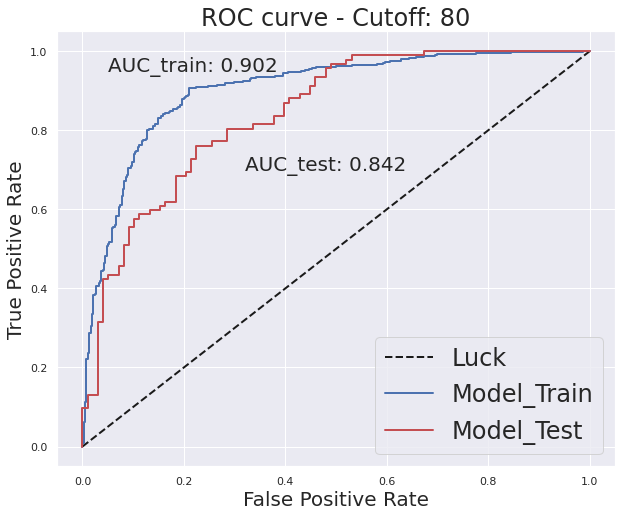

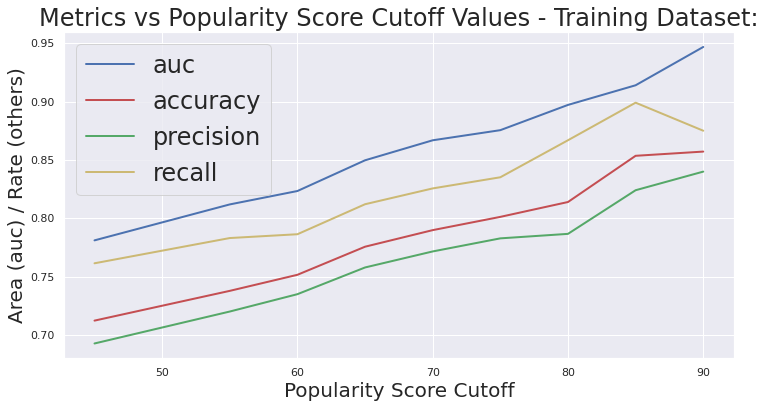

Normalized confusion matrix
[[0.80319149 0.19680851]
 [0.12565445 0.87434555]]


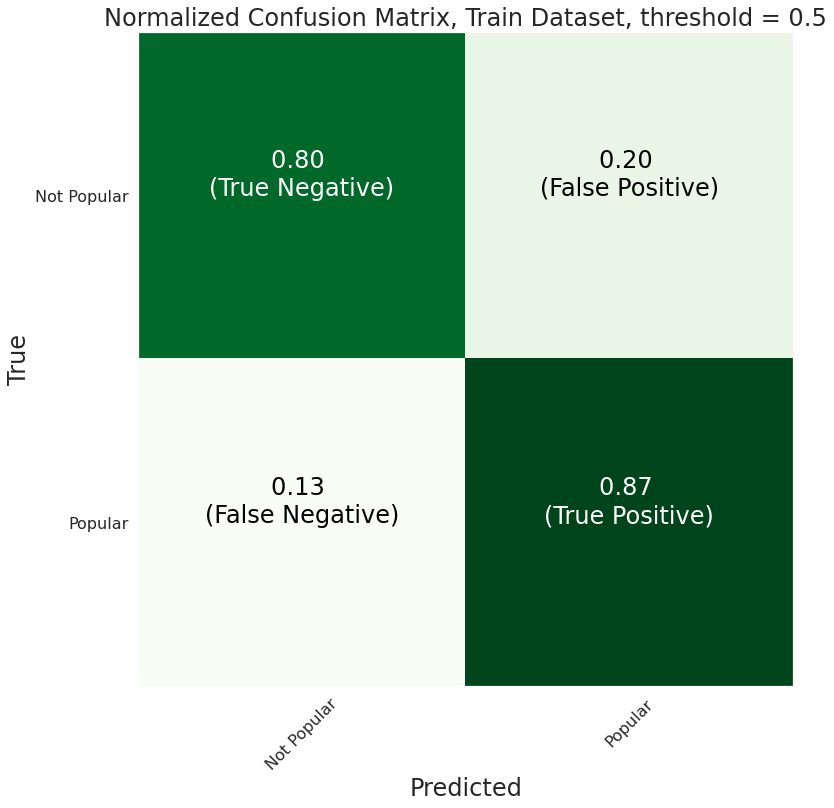

Normalized confusion matrix
[[0.65306122 0.34693878]
 [0.18478261 0.81521739]]


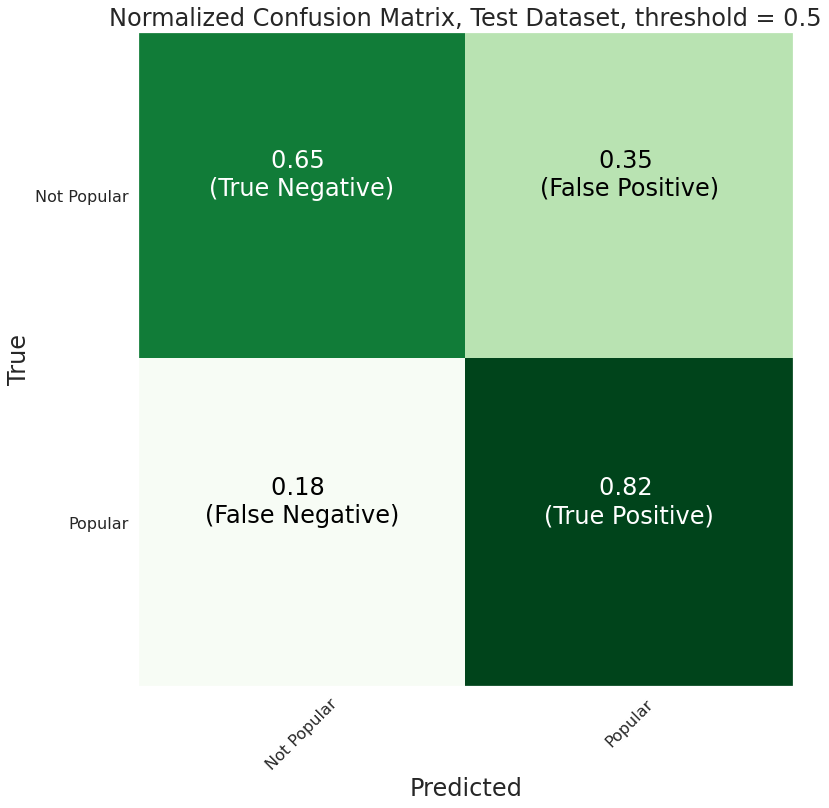

[[-0.68472185  2.54970512 -0.5841486  -2.55986632 -2.06726916 -0.01761007
  -1.24121891  2.0028135  -0.30741901 -0.23895282 -0.06834698 -2.21013668]]


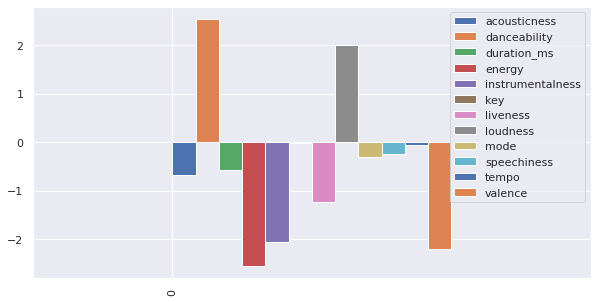

acousticness             0.830000
danceability             0.512000
duration_ms         185320.000000
energy                   0.462000
instrumentalness         0.166000
key                      9.000000
liveness                 0.121000
loudness               -10.491000
mode                     1.000000
speechiness              0.040800
tempo                  112.050000
valence                  0.353000
pop_bin                  1.000000
pop_predict              0.270548
pop_predict_bin          0.000000
Name: 7, dtype: float64
0.27054828249431434
[ 0.98        0.261      -0.38837462  0.156       0.0206      4.
  0.156      -1.79485477  1.          0.0287      1.04362131  0.453     ]
[ 0.98        0.261      -0.38837462  0.156       0.0206      4.
  0.156      -1.79485477  1.          0.0287      1.04362131  0.453     ]
[-3.78222265]
[0.02277202]
[0.022265]
Dela in p values is -0.2482833, woo hoo!!!


In [152]:
'''
Logistic Regression using all available features

'''
from pandas.plotting import scatter_matrix
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from scipy import stats  
from statsmodels.discrete.discrete_model import Logit
from statsmodels.tools import add_constant

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn import metrics
import itertools
global cols_to_stardardize
cols_to_standardize = ['duration_ms', 'loudness', 'tempo']
def load_data():
    df = pd.read_csv('data.csv')
    return df
  

def set_view_options(max_cols=50, max_rows=50, max_colwidth=9, dis_width=250):
    pd.options.display.max_columns = max_cols
    pd.options.display.max_rows = max_rows
    pd.set_option('max_colwidth', max_colwidth)
    pd.options.display.width = dis_width
def split_sample_combine(df, cutoff=55, col='popularity', rand=None):
    # split out popular rows above the popularity cutoff
    split_pop_df = df[df[col] > cutoff].copy()
    
    # get the leftover rows, the 'unpopular' songs
    df_leftover = df[df[col] < cutoff].copy()
    
    # what % of the original data do we now have?
    ratio = split_pop_df.shape[0] / df.shape[0]
    
    # what % of leftover rows do we need?
    ratio_leftover = split_pop_df.shape[0] / df_leftover.shape[0]
    
    # get the exact # of unpopular rows needed, using a random sampler
    unpop_df_leftover, unpop_df_to_add = train_test_split(df_leftover, \
                                                          test_size=ratio_leftover, \
                                                          random_state = rand)
    
    # combine the dataframes to get total rows = split_pop_df * 2
    # ssc stands for "split_sample_combine"
    ssc_df = split_pop_df.append(unpop_df_to_add).reset_index(drop=True)

    # shuffle the df
    ssc_df = ssc_df.sample(frac=1, random_state=rand).reset_index(drop=True)
    
    # add key_notes mapping key num vals to notes
    key_mapping = {0.0: 'C', 1.0: 'C♯,D♭', 2.0: 'D', 3.0: 'D♯,E♭', 
                   4.0: 'E', 5.0: 'F', 6.0: 'F♯,G♭', 7.0: 'G', 
                   8.0: 'G♯,A♭', 9.0: 'A', 10.0: 'A♯,B♭', 11.0: 'B'}
    ssc_df['key_notes'] = ssc_df['key'].map(key_mapping)
    
    # add columns relating to popularity
    ssc_df['pop_frac'] = ssc_df['popularity'] / 100
    ssc_df['pop_cat'] = np.where(ssc_df['popularity'] > cutoff, "Popular", "Not_Popular")
    ssc_df['pop_bin'] = np.where(ssc_df['popularity'] > cutoff, 1, 0)
    
    return ssc_df

# standardize data and return X and y dfs for linear regresssion
def standardize_return_X_y(df, std=True, log=False):
    df = df.copy()
    
    # standardize some columns if std = True
    if std == True:
        for col in cols_to_standardize:
            new_col_name = col + "_std"
            df[new_col_name] = (df[col] - df[col].mean()) / df[col].std()

        X_cols = ['acousticness', 'danceability', 'duration_ms_std', 'energy', 
                  'instrumentalness', 'key', 'liveness', 'loudness_std', 'mode', 
                  'speechiness', 'tempo_std', 'valence']
    else:
        X_cols = ['acousticness', 'danceability', 'duration_ms', 'energy', 
                  'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 
                  'speechiness', 'tempo', 'valence']
        
    # if log = True, let's transform y to LOG
    if log == True:
        df['pop_log'] = df['popularity'] / 100
        df['pop_log'] = [0.00000001 if x == 0 else x for x in df['pop_log']]
        df['pop_log'] = [0.99999999 if x == 1 else x for x in df['pop_log']]
        df['pop_log'] = np.log(df['pop_log'] / (1 - df['pop_log']))
        y_col = ['pop_log']
            
    else:
        y_col = ['popularity']

    # split into X and y
    X = df[X_cols]
    y = df[y_col]
    
    return X, y

def return_X_y_logistic(df):
    df = df.copy()

    # define columns to use for each
    X_cols = ['acousticness', 'danceability', 'duration_ms', 'energy', 
              'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 
              'speechiness', 'tempo', 'valence']

    # use 1's and 0's for logistic
    y_col = ['pop_bin']

    # split into X and y
    X = df[X_cols]
    y = df[y_col]

    return X, y

def return_X_y_logistic_more_cols(df):
    df = df.copy()

    # define columns to use for each
    X_cols = ['acousticness', 'danceability', 'duration_ms', 'energy', 
              'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 
              'speechiness', 'tempo', 'valence']

    # use 1's and 0's for logistic
    y_col = ['pop_bin']

    # split into X and y
    X = df[X_cols]
    y = df[y_col]

    return X, y

def return_X_y_logistic_sig_only(df):
    df = df.copy()

    # define columns to use for each
    X_cols = ['danceability','energy', 
              'instrumentalness', 'loudness']

    # use 1's and 0's for logistic
    y_col = ['pop_bin']

    # split into X and y
    X = df[X_cols]
    y = df[y_col]

    return X, y

def standardize_X_sig_only(X):  
    X = X.copy()
    
    cols = ['loudness']
    # standardize only columns not between 0 and 1
    for col in cols:
        new_col_name = col + "_std"
        X[new_col_name] = (X[col] - X[col].mean()) / X[col].std()
        
    X_cols = ['danceability','energy', 
              'instrumentalness', 'loudness_std']

    # return the std columns in a dataframe
    X = X[X_cols]
    
    return X

def standardize_X(X):  
    X = X.copy()
    
    # standardize only columns not between 0 and 1
    for col in cols_to_standardize:
        new_col_name = col + "_std"
        X[new_col_name] = (X[col] - X[col].mean()) / X[col].std()
        
    X_cols = ['acousticness', 'danceability', 'duration_ms_std', 'energy', 
                  'instrumentalness', 'key', 'liveness', 'loudness_std', 'mode', 
                  'speechiness', 'tempo_std', 'valence']

    # return the std columns in a dataframe
    X = X[X_cols]
    
    return X

def standardize_X_train_test(X_train, X_test):  
    X_train = X_train.copy()
    X_test = X_test.copy() 
    
    # standardize only columns not between 0 and 1
    for col in cols_to_standardize:
        new_col_name = col + "_std"
        X_train[new_col_name] = (X_train[col] - X_train[col].mean()) / X_train[col].std()
        X_test[new_col_name] = (X_test[col] - X_test[col].mean()) / X_test[col].std()
    
    X_cols = ['acousticness', 'danceability', 'duration_ms_std', 'energy', 
                  'instrumentalness', 'key', 'liveness', 'loudness_std', 'mode', 
                  'speechiness', 'tempo_std', 'valence']

    # return the std columns in a dataframe
    X_train_std = X_train[X_cols]
    X_test_std = X_test[X_cols]
    
    return X_train_std, X_test_std

# Create a basic logistic regression
def basic_logistic_regression(df, cutoff=55, rand=0, sig_only=False):
    df = df.copy()

    if sig_only == True:
        X, y = return_X_y_logistic_sig_only(split_sample_combine(df, cutoff=cutoff, rand=rand))
        X = standardize_X_sig_only(X)

    else:
        X, y = return_X_y_logistic(split_sample_combine(df, cutoff=80, rand=rand))
        X = standardize_X(X)

    X_const = add_constant(X, prepend=True)

    logit_model = Logit(y, X_const).fit()
    
    print(logit_model.summary())

    return logit_model

def logistic_regression_with_kfold(df, cutoff=55, rand=0, sig_only=False):
    df = df.copy()
    
    if sig_only == True:
        X, y = return_X_y_logistic_sig_only(split_sample_combine(df, cutoff=cutoff, rand=rand))
        X = standardize_X_sig_only(X)

    else:
        X, y = return_X_y_logistic(split_sample_combine(df, cutoff=cutoff, rand=rand))
        X = standardize_X(X)

    X = X.values
    y = y.values.ravel()

    classifier = LogisticRegression()

    # before kFold
    y_predict = classifier.fit(X, y).predict(X)
    y_true = y
    accuracy_score(y_true, y_predict)
    print(f"accuracy: {accuracy_score(y_true, y_predict)}")
    print(f"precision: {precision_score(y_true, y_predict)}")
    print(f"recall: {recall_score(y_true, y_predict)}")
    print(f"The coefs are: {classifier.fit(X,y).coef_}")

    # with kfold
    kfold = KFold(len(y))

    accuracies = []
    precisions = []
    recalls = []

    for train_index, test_index in kfold:
        model = LogisticRegression()
        model.fit(X[train_index], y[train_index])

        y_predict = model.predict(X[test_index])
        y_true = y[test_index]

        accuracies.append(accuracy_score(y_true, y_predict))
        precisions.append(precision_score(y_true, y_predict))
        recalls.append(recall_score(y_true, y_predict))

    print(f"accuracy: {np.average(accuracies)}")
    print(f"precision: {np.average(precisions)}")
    print(f"recall: {np.average(recalls)}")

# this is the code for the final logistic regression I chose, after running all the above
# logistic regression models and k-fold cross-val analysis
def logistic_regression_final(df, plot_the_roc=True):
    df = df.copy()
    cutoff = 80
    
    X, y = return_X_y_logistic_more_cols(split_sample_combine(df, cutoff=cutoff, rand=2))

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2)

    global df_train_results_log80 
    global df_test_results_log80
    df_train_results_log80 = X_train.join(y_train)
    df_test_results_log80 = X_test.join(y_test)

    # standardize X_train and X_test
    X_train = standardize_X(X_train)
    X_test = standardize_X(X_test)

    X_train = X_train.values
    y_train = y_train.values.ravel()

    X_test = X_test.values
    y_test = y_test.values.ravel()

    global sanity_check
    sanity_check = X_test

    ## Run logistic regression on all the data
    classifier = LogisticRegression()
    # note using .predict_proba() below, which is the probability of each class
    
    #predict values for X_train
    y_predict_train = classifier.fit(X_train,y_train).predict(X_train)
    probs_0and1_train = classifier.fit(X_train,y_train).predict_proba(X_train)
    y_prob_P_train = probs_0and1_train[:,1]

    # predict values for X_test
    y_predict_test = classifier.fit(X_train,y_train).predict(X_test)
    probs_0and1_test = classifier.fit(X_train,y_train).predict_proba(X_test) # yes!
    y_prob_P_test = probs_0and1_test[:,1]

    # calculate metrics needed to use for ROC curve below
    fpr_train, tpr_train, thresholds_train = metrics.roc_curve(y_train, y_prob_P_train, pos_label=1)
    auc_train = metrics.roc_auc_score(y_train, y_prob_P_train) # note we are scoring on our training data!

    fpr_test, tpr_test, thresholds_test = metrics.roc_curve(y_test, y_prob_P_test, pos_label=1)
    auc_test = metrics.roc_auc_score(y_test, y_prob_P_test) # note we are scoring on our training data!

    # print some metrics
    print("Train accuracy: {:.2f}".format(accuracy_score(y_train, y_predict_train)))
    print("Test accuracy: {:.2f}".format(accuracy_score(y_test, y_predict_test)))

    print("Train recall: {:.2f}".format(recall_score(y_train, y_predict_train)))
    print("Test recall: {:.2f}".format(recall_score(y_test, y_predict_test)))

    print("Train precision: {:.2f}".format(precision_score(y_train, y_predict_train)))
    print("Test precision: {:.2f}".format(precision_score(y_test, y_predict_test)))

    print("Train auc: {:.2f}".format(auc_train))
    print("Test auc: {:.2f}".format(auc_test))

    global conf_matrix_log80_train
    global conf_matrix_log80_test
    conf_matrix_log80_train = confusion_matrix(y_train, y_predict_train)
    conf_matrix_log80_test = confusion_matrix(y_test, y_predict_test)

    global final_coefs
    global final_intercept
    final_coefs = classifier.fit(X_train,y_train).coef_
    final_intercept = classifier.fit(X_train,y_train).intercept_

    # Back of the envelope calcs to make sure metrics above are correct
    df_train_results_log80 = df_train_results_log80.reset_index(drop=True)
    df_train_results_log80['pop_predict'] = y_prob_P_train

    df_test_results_log80 = df_test_results_log80.reset_index(drop=True)
    df_test_results_log80['pop_predict'] = y_prob_P_test

    df_train_results_log80['pop_predict_bin'] = np.where(df_train_results_log80['pop_predict'] >= 0.5, 1, 0)
    df_test_results_log80['pop_predict_bin'] = np.where(df_test_results_log80['pop_predict'] >= 0.5, 1, 0)
    
    print("Back of the envelope calc for Train Recall")
    print(sum((df_train_results_log80['pop_predict_bin'].values * df_train_results_log80['pop_bin'].values))/ df_train_results_log80['pop_bin'].sum())

    if plot_the_roc == True:
        # Plot the ROC
        fig = plt.figure(figsize=(10,8))
        ax = fig.add_subplot(111)
        ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='k',
                label='Luck')
        ax.plot(fpr_train, tpr_train, color='b', lw=2, label='Model_Train')
        ax.plot(fpr_test, tpr_test, color='r', lw=2, label='Model_Test')
        ax.set_xlabel("False Positive Rate", fontsize=20)
        ax.set_ylabel("True Positive Rate", fontsize=20)
        ax.set_title("ROC curve - Cutoff: " + str(cutoff), fontsize=24)
        ax.text(0.05, 0.95, " ".join(["AUC_train:",str(auc_train.round(3))]), fontsize=20)
        ax.text(0.32, 0.7, " ".join(["AUC_test:",str(auc_test.round(3))]), fontsize=20)
        ax.legend(fontsize=24)
        plt.show()

# print out confusion matrix
def print_confusion_matrix(df, cutoff=55, rand=0):
    df = df.copy()

    X, y = return_X_y_logistic(split_sample_combine(df, cutoff=80, rand=rand))
    X = standardize_X(X)

    X = X.values
    y = y.values.ravel()

    ## Run logistic regression on all the data
    classifier = LogisticRegression()
    # note using .predict() below, which uses default 0.5 for a binary classifier
    y_pred = classifier.fit(X,y).predict(X) # agh! this uses 0.5 threshold for binary classifier
    y_true = y

    # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_true, y_pred)
    np.set_printoptions(precision=2)
    print("| TN | FP |\n| FN | TP |\n")
    print(cnf_matrix)
    print(f"The accurracy is {accuracy_score(y_true, y_pred)}")
    print(f"The accurracy (check) is {(cnf_matrix[1][1]+ cnf_matrix[0][0])/np.sum(cnf_matrix)}")

# plot popularity score cutoffs vs. logistic regression metrics
def plot_cutoffs_vs_metrics(df):
    df = df.copy()

    df_cols = ['auc', 'accuracy', 'precision', 'recall', 'cutoff', 'type']
    df_metrics = pd.DataFrame(columns = df_cols)
    cutoff_range = [45, 55, 60, 65, 70, 75, 80, 85, 90]
    
    for cutoff in cutoff_range:
        X, y = return_X_y_logistic(split_sample_combine(df, cutoff=cutoff, rand=0))

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

        X_train = standardize_X(X_train)
        X_test = standardize_X(X_test)

        X_train = X_train.values
        y_train = y_train.values.ravel()

        X_test = X_test.values
        y_test = y_test.values.ravel()
        
        classifier = LogisticRegression()
        y_predict_train = classifier.fit(X_train, y_train).predict(X_train)
        probs_0and1_train = classifier.fit(X_train,y_train).predict_proba(X_train)
        y_prob_P_train = probs_0and1_train[:,1]
        
        test_metrics = []
        # calculate metrics for JUST train
        test_metrics.append(metrics.roc_auc_score(y_train, y_prob_P_train))
        test_metrics.append(accuracy_score(y_train, y_predict_train))
        test_metrics.append(precision_score(y_train, y_predict_train))
        test_metrics.append(recall_score(y_train, y_predict_train))
        test_metrics.append(int(cutoff))
        test_metrics.append("Test")
        
        df_metrics.loc[cutoff] = test_metrics
        df_metrics = df_metrics.reset_index(drop=True)
        df_metrics["cutoff"] = pd.to_numeric(df_metrics["cutoff"])
        
    # plot metrics vs. popularity score cutoff
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot(111)

    ax.plot(df_metrics['cutoff'], df_metrics['auc'], color='b', lw=2, label='auc')
    ax.plot(df_metrics['cutoff'], df_metrics['accuracy'], color='r', lw=2, label='accuracy')
    ax.plot(df_metrics['cutoff'], df_metrics['precision'], color='g', lw=2, label='precision')
    ax.plot(df_metrics['cutoff'], df_metrics['recall'], color='y', lw=2, label='recall')

    ax.set_xlabel("Popularity Score Cutoff", fontsize=20)
    ax.set_ylabel("Area (auc) / Rate (others)", fontsize=20)
    ax.set_title("Metrics vs Popularity Score Cutoff Values - Training Dataset:", fontsize=24)
    ax.legend(fontsize=24)
    plt.show()

# plot a confusion matrix
def plot_confusion_matrix(cm, ax, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    """
    This function prints and plots the confusion matrix.
    """
    font_size = 24
    p = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.set_title(title,fontsize=font_size)
    
    tick_marks = np.arange(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_xticklabels(classes, rotation=45, fontsize=16)
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(classes, fontsize=16)
   
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if i == 1 and j == 1:
            lbl = "(True Positive)"
        elif i == 0 and j == 0:
            lbl = "(True Negative)"
        elif i == 1 and j == 0:
            lbl = "(False Negative)"
        elif i == 0 and j == 1:
            lbl = "(False Positive)"
        ax.text(j, i, "{:0.2f} \n{}".format(cm[i, j], lbl),
                 horizontalalignment="center", size = font_size,
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    ax.set_ylabel('True',fontsize=font_size)
    ax.set_xlabel('Predicted',fontsize=font_size)

# plot confusion matrix for final Train dataset
def plot_conf_matrix_Train():
    fig = plt.figure(figsize=(12,11))
    ax = fig.add_subplot(111)
    ax.grid(False)
    class_names = ["Not Popular","Popular"]
    plot_confusion_matrix(conf_matrix_log80_train, ax, classes=class_names,normalize=True,
                      title='Normalized Confusion Matrix, Train Dataset, threshold = 0.5')
    plt.show()

# plot confusion matrix for final Test dataset
def plot_conf_matrix_Test():
    fig = plt.figure(figsize=(12,11))
    ax = fig.add_subplot(111)
    ax.grid(False)
    class_names = ["Not Popular","Popular"]
    plot_confusion_matrix(conf_matrix_log80_test, ax, classes=class_names,normalize=True,
                      title='Normalized Confusion Matrix, Test Dataset, threshold = 0.5')
    plt.show()

# plot final coefficients of logistic regression
def plot_final_coeffs():
    columns_bar = ['acousticness', 'danceability','duration_ms', 'energy', 'instrumentalness', 
                   'key', 'liveness','loudness', 'mode', 'speechiness', 'tempo', 
                   'valence']
    df_final_coefs = pd.DataFrame(data = final_coefs, columns = columns_bar)
    df_final_coefs.plot(kind = 'bar', figsize=(10, 5), align='edge')
    plt.show()

def get_true_positives():
    # Songs my test model predicted were popular that are actually popular (true positives)
    print(df_test_results_log80[(df_test_results_log80['pop_predict_bin'] == 1) & (df_test_results_log80['pop_bin'] == 1)])

def get_true_negatives():
    # Songs my test model predicted were not popular that are not actually popular (true negatives)
    print(df_test_results_log80[(df_test_results_log80['pop_predict_bin'] == 0) & (df_test_results_log80['pop_bin'] == 0)])

def get_false_positives():
    # Songs my testodel predicted were popular that are not actually popular (false positives)
    print(df_test_results_log80[(df_test_results_log80['pop_predict_bin'] == 1) & (df_test_results_log80['pop_bin'] == 0)])
    # calculate false positive rate
    df_train_results_log80[(df_train_results_log80['pop_predict_bin'] == 1) & (df_train_results_log80['pop_bin'] == 0)].count() / df_train_results_log80[df_train_results_log80['pop_bin'] == 0].count()

def get_false_negatives():
    # Songs my test model predicted were not popular that are actually popular (false negatives)
    print(df_test_results_log80[(df_test_results_log80['pop_predict_bin'] == 0) & (df_test_results_log80['pop_bin'] == 1)])

def sanity_check_test():
    # grab a record from the results dataframe
    sanity_check_loc = df_test_results_log80[(df_test_results_log80['pop_predict_bin'] == 0) & (df_test_results_log80['pop_bin'] == 1)].iloc[0]
    # set the probability that song has a popularity score >=80 = sanity_check_prob
    sanity_check_prob = sanity_check_loc['pop_predict']

    # print these to make sure they make sense
    print(sanity_check_loc)
    print(sanity_check_prob)

    # this record coresponds to the 9th row of X_test within the logistic regression function (I know becuase I looked ;)
    print(sanity_check[9, :])
    
    # grab the standardized variables from X_test
    sanity_check_std_vars = sanity_check[9, :]
    print(sanity_check_std_vars)

    # multiply the standardized variables by the regression coefficients, sum them and add the intercept
    mult_coefs_vars_add_intercept = sum(sanity_check_std_vars*final_coefs.reshape(12)) + final_intercept
    print(mult_coefs_vars_add_intercept)

    # since the log odds = P / 1-P, need to exponentiate this to get to the final predicted probability
    exponentiated = np.exp(mult_coefs_vars_add_intercept)
    print(exponentiated)

    # finally, calculate P, the odds of popular (popularity score >= 80)
    p = exponentiated / (1 + exponentiated)
    print(p)

    # does this equal what we think it should???
    delta_ps = float(p - sanity_check_prob)
    print(f"Dela in p values is {delta_ps:.7f}, woo hoo!!!")

if __name__ == "__main__":
    # load data
    df = load_data()
    # set nice view options for terminal viewing
    set_view_options(max_cols=50, max_rows=50, max_colwidth=40, dis_width=250)

    ''' All basic functions commented out so tons of plots don't pop up at once'''
    # get basic info from dataset
    #get_df_info(df)

    # Take a look at the data with truncated columns
    #describe_cols(df, 9)

    # look at top correlations - look into multicollinearity
    #get_top_abs_correlations(df, 10)
    
    ''' All these plots are commented out for now '''  
    # scatter_plot(df, 'danceability', 'popularity')
    # scatter_plot(df, 'duration_ms', 'popularity')
    # scatter_plot(df, 'key', 'popularity')
    # scatter_plot(df, 'acousticness', 'popularity')
    
    ''' Uncomment these to run any or all of the functions defined above 
        Many of these are plots, so commented out for now     ''' 
    #linear_regression_initial(df)
    #plot_pop_dist(df)
    #undersample_plot(df)
    #get_stats(df)
    #plot_univ_dists(df, 85)
    #plot_violin(df, 55)
    #plot_pairplot(df, 500, 55)
    #plot_keys(df, 55)
    #plot_heatmap(df)
    #calc_ANOVA(df, 55)
    #df_samples = random_under_sampler(df, 80)
    #linear_regression_initial(df_samples)
    #plot_hist(df_samples)
    #search_artist_track_name(df, "Chain", "Some")
    #df_cols = add_cols(df, 80)
    #df_split = split_sample_combine(df, cutoff=65, rand=0)
    #linear_regression_final(df_split, show_plots=False)
    #linear_regression_sklearn(df_split, show_plots=True)
    #basic_logistic_regression(df, cutoff=80, rand=0)
    #logistic_regression_with_kfold(df, cutoff=80, rand=0)
    #logistic_regression_with_kfold(df, cutoff=80, rand=0, sig_only=True)
    #print_confusion_matrix(df, cutoff=80, rand=0)
    
    # Calculate and plot final logistic regression values
    logistic_regression_final(df, plot_the_roc=True)
    plot_cutoffs_vs_metrics(df)
    plot_conf_matrix_Train()
    plot_conf_matrix_Test()
    print(final_coefs)
    plot_final_coeffs()
    #get_true_positives()
    #get_true_negatives()
    #get_false_positives()
    #get_false_negatives()
    sanity_check_test()

In [153]:
df=pd.read_csv('data.csv')
song_features = pd.DataFrame()
# normalizer instance
scaler = MinMaxScaler()
for col in df.iloc[:,:-1].columns:      # excluding year col i.e, of int64 type
    if df[col].dtypes in ['float64', 'int64']:
        # adding normalized col
        scaler.fit(df[[col]])
        song_features[col] = scaler.transform(df[col].values.reshape(-1,1)).ravel() 

In [154]:
'''Perform K-Means Clustering with no.of clusters=25'''
from sklearn.preprocessing import MinMaxScaler 
from sklearn.cluster import KMeans 
km = KMeans(n_clusters=25)
predicted_genres = km.fit_predict(song_features)
print(predicted_genres)


[ 9  9 12 ... 22  6  5]


In [155]:
print(predicted_genres.shape)

(174389,)


Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy', 'explicit', 'instrumentalness', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'valence', 'year', 'genre', 'key_1', 'key_2', 'key_3', 'key_4', 'key_5', 'key_6',
       'key_7', 'key_8', 'key_9', 'key_10', 'key_11'],
      dtype='object')
['danceability', 'duration_ms', 'explicit', 'liveness', 'mode', 'speechiness', 'tempo', 'valence', 'key_1', 'key_2', 'key_3', 'key_4', 'key_5', 'key_6', 'key_7', 'key_8', 'key_9', 'key_10', 'key_11']


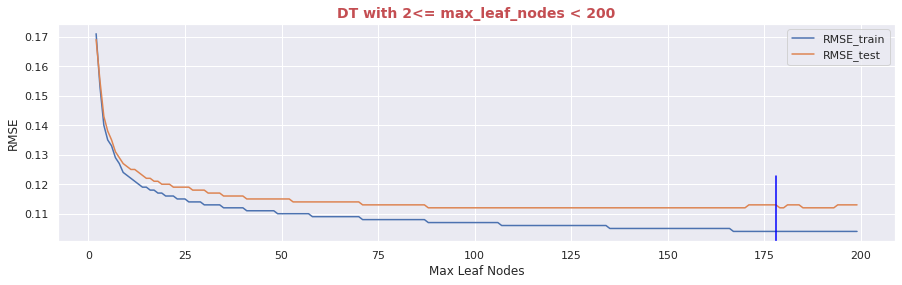

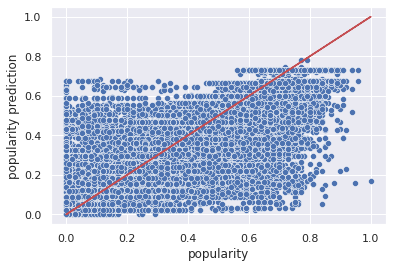

Minimum validiation is: 92.035% in index number 169
Maximum validiation is: 101.183% in index number 0


In [156]:
'''
Add clustering output as feature to dataset
Decision Tree using :

year              -->  0.51 (abs)
acousticness      -->  0.40 (abs)
loudness          -->  0.34 (abs)
energy            -->  0.33 (abs)
instrumentalness  -->  0.30 (abs)
Artist Information
Clustering Output
'''
df=pd.read_csv('data.csv')
df['genre']=predicted_genres
cols = list(pd.read_csv('data.csv', nrows =1))
df=df.drop(columns=['id','name','release_date'])
# Remove duplicated
df = df[~df.duplicated()==1]
# df = df.sample(frac=0.3)
#Split the data to train and test
X_train, X_test, y_train, y_test = split(df.drop('popularity', axis=1), df['popularity'], test_size = 0.2, random_state = 12345)
artists_transformer = ArtistsTransformer(MinCnt=2)
X_train = artists_transformer.fit(X_train, y_train).transform(X_train, y_train)
X_test = artists_transformer.transform(X_test, y_test)
speech_tranformer = FunctionTransformer(speech_criteria)
speech_tranformer.transform(X_train)
speech_tranformer.transform(X_test)
tempo_transformer = ReplaceZeroTransformer()
X_train = tempo_transformer.transform(X_train)
X_test = tempo_transformer.transform(X_test)
ohe = OneHotEncoder(categories='auto', drop='first')

# Train
feature_arr = ohe.fit_transform(X_train[['key']]).toarray()
columns_key = ['key_'+str(i) for i in list(set(X_train['key'].values))[1:]]
feature_labels = columns_key
feature_labels = np.concatenate((feature_labels), axis=None)
features = pd.DataFrame(feature_arr, columns = feature_labels, index = X_train.index)
X_train = pd.concat([X_train, features], axis=1).drop(['key',], axis=1)

# Test
feature_arr = ohe.fit_transform(X_test[['key']]).toarray()
columns_key = ['key_'+str(i) for i in list(set(X_test['key'].values))[1:]]
feature_labels = columns_key
feature_labels = np.concatenate((feature_labels), axis=None)
features = pd.DataFrame(feature_arr, columns = feature_labels, index = X_test.index)
X_test = pd.concat([X_test, features], axis=1).drop(['key'], axis=1)


scaler = MinMaxScaler()
cols = ['duration_ms','loudness','tempo']
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.fit_transform(X_test[cols])

y_train = y_train / 100
y_test = y_test / 100
print(X_train.columns)
RMSE3_train, RMSE3_test = [], []
cols = ['danceability', 'duration_ms','explicit', 'liveness',  'mode', 'speechiness', 'tempo', 'valence','key_1', 'key_2', 'key_3', 'key_4', 'key_5', 'key_6', 'key_7','key_8', 'key_9', 'key_10', 'key_11']
print(cols)

for i in range(2,200):
  tree = DecisionTreeRegressor(random_state = 15, max_leaf_nodes=i)
  tree.fit(X_train.drop(columns=cols), y_train)
  y_train_pred = tree.predict(X_train.drop(columns=cols)).clip(0, 1)
  train_rmse = np.sqrt(mse(y_train, y_train_pred))
  RMSE3_train.append(train_rmse.round(3))
  y_test_pred = tree.predict(X_test.drop(columns=cols)).clip(0, 1)
  test_rmse = np.sqrt(mse(y_test, y_test_pred))
  RMSE3_test.append(test_rmse.round(3))


fig, ax = plt.subplots(figsize=(15,4))
x = np.arange(2, 200)
ax = sns.lineplot(x=x, y=RMSE3_train)
sns.lineplot(x=x, y=RMSE3_test, ax=ax)
ax.axvline(x=178, ymin=0, ymax=0.3, color='blue')
# ax.axvline(x=139, ymin=0.5, ymax=0.8, color='orange')
ax.legend(labels=['RMSE_train', 'RMSE_test'], bbox_to_anchor=(1, 1))
ax.set_xlabel('Max Leaf Nodes')
ax.set_ylabel('RMSE')
ax.set_title('DT with 2<= max_leaf_nodes < 200', c='r', fontdict={'c':'r', 'fontsize':14, 'weight':'bold'})
plt.show()


ax = sns.scatterplot(x=y_train, y=y_train_pred)
ax.plot(y_train, y_train, 'r')
ax.set_ylabel('popularity prediction')
plt.show()


gap3 = [(RMSE3_train[i]/RMSE3_test[i]) for i, num in enumerate(RMSE3_train)]

print(f'Minimum validiation is: {min(gap3):.3%} in index number {gap3.index(min(gap3))}')
print(f'Maximum validiation is: {max(gap3):.3%} in index number {gap3.index(max(gap3))}')




In [159]:
print(RMSE3_train[169])
print(RMSE3_test[169])
cols = ['danceability', 'duration_ms','explicit', 'liveness',  'mode', 'speechiness', 'tempo', 'valence','key_1', 'key_2', 'key_3', 'key_4', 'key_5', 'key_6', 'key_7','key_8', 'key_9', 'key_10', 'key_11']
print(X_train.drop(columns=cols).columns)
tree = DecisionTreeRegressor(max_leaf_nodes=171)
tree.fit(X_train.drop(columns=cols), y_train)
y_train_pred = tree.predict(X_train.drop(columns=cols)).clip(0, 1)
train_rmse = np.sqrt(mse(y_train, y_train_pred))
y_test_pred = tree.predict(X_test.drop(columns=cols)).clip(0, 1)
test_rmse = np.sqrt(mse(y_test, y_test_pred))
print(f'train: {train_rmse}')
print(f'test: {test_rmse}')

0.104
0.113
Index(['acousticness', 'artists', 'energy', 'instrumentalness', 'loudness', 'year', 'genre'], dtype='object')
train: 0.10439818019961461
test: 0.11250209287469569


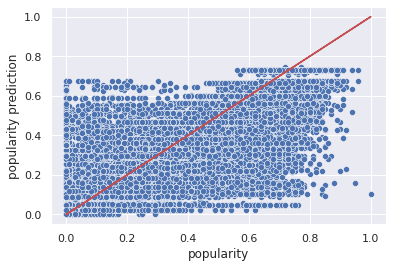

In [160]:
ax = sns.scatterplot(x=y_train, y=y_train_pred)
ax.plot(y_train, y_train, 'r')
ax.set_ylabel('popularity prediction')
plt.show()